# <font color='blue'>Assignment: MSE-vs-MAE</font>

In the lecture, we have seen that `Mean Absolute Error` (`MAE`) is more robust to outlier compare to `Mean Square Error` (`MSE`). In this assignment, we have to be a witness to this theory. 

Although we have an intuition that it is bound to happen because the cost of outliers is much more in `MSE` compare to `MAE`. Let's implement and witness it. 

**In this assignment, you have to implement the following:**

- `Mean Square Error (MSE)`


- `Mean Absolute Error (MAE)`


- The gradient with respect to `m` and `c`, when the loss function is `MSE`


- The gradient with respect to `m` and `c`, when the loss function is `MAE`

Codes for training and visualization is already in the notebook.

## <font color='blue'>Marking Scheme</font>

#### Maximum Points: 30

<div>
    <table>
        <tr><td><h3>Sr. no.</h3></td> <td><h3>Problem</h3></td> <td><h3>Points</h3></td> </tr>
        <tr><td><h3>1</h3></td> <td><h3>Mean Square Error (MSE)</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>2</h3></td> <td><h3>Mean Absolute Error (MAE)</h3></td> <td><h3>5</h3></td> </tr>
        <tr><td><h3>3</h3></td> <td><h3>Gradients for MSE</h3></td> <td><h3>10</h3></td> </tr>
        <tr><td><h3>4</h3></td> <td><h3>Gradients for MAE</h3></td> <td><h3>10</h3></td> </tr>
    </table>
</div>


In [7]:
%matplotlib inline

In [31]:
import torch
import matplotlib.pyplot as plt

from collections import defaultdict


plt.style.use('ggplot')

torch.manual_seed(0)

In [54]:
plt.rcParams["figure.figsize"] = (15, 8)

# <font style="color:green">1. Generate Data </font>
We will generate 1000 data points for the experiment. The `x-axis` is the independent variable which has values randomly distributed between -5 to 5. We assume some values for m and c to create the data points for the dependent variable ( `y-axis` ). We also add some randomness so that the y values are different for the same x. 

Now, we have a simple dataset which has been generated using a linear model in the presence of noise. We have also converted five percent of data into outliers to observe the performance difference between MSE and MAE at the time of training. The data has been dispayed using the scatter plot.

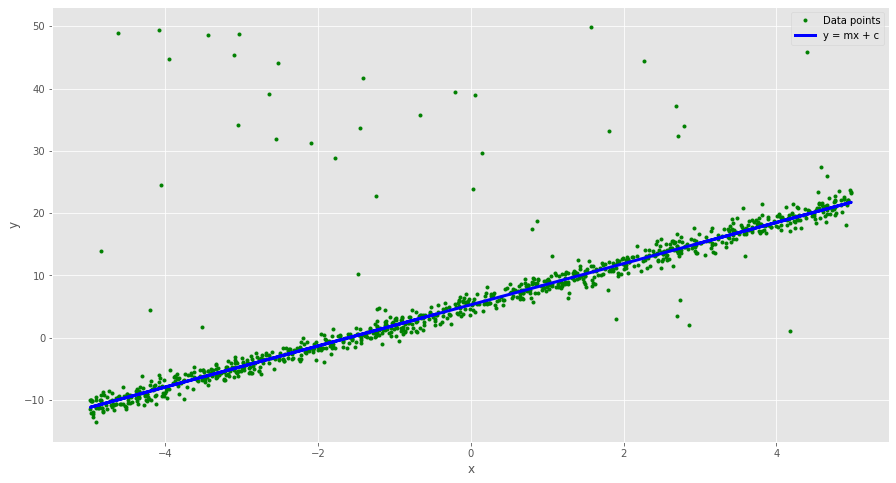

In [55]:
# Generating y = mx + c + random noise
num_data = 1000

# True values of m and c
m_line = 3.3
c_line = 5.3

# input (Generate random data between [-5,5])
x = 10 * torch.rand(num_data) - 5

# Output (Generate data assuming y = mx + c + noise)
y_label = m_line * x + c_line + torch.randn_like(x)

# Add a few outlier
num_outliers = int(0.05 * num_data)
random_index = torch.randint(num_data, (num_outliers,))
y_label[random_index] = 50 * torch.rand(len(random_index))

y = m_line * x + c_line

# Plot the generated data points 
plt.plot(x, y_label, '.', color='g', label="Data points")
plt.plot(x, y, color='b', label='y = mx + c', linewidth=3)
plt.ylabel('y')
plt.xlabel('x')
plt.legend()
plt.show()

# <font style="color:green">2. Problem Formulation</font>

The goal is to predict $y$ given some value of $x$. To do this we will fit a line that goes through the data points $(x_i, y_i)$. The equation for such a line is 

$$
y = mx + c
$$

We have a set of data points $(x_i, y_i)$, and they should all satisfy the equation above. i.e., 

$$
y_i = m x_i + c
$$

Unless we have perfect data with no noise, even the best $m$ and $c$ we can find will not perfectly fit the data. So, we will have an **error** or a **residual** given by

$$
e_i = (y_i - m x_i -c) 
$$

We want to find a value of $m$ and $c$ that minimizes the error above. Positive or negative values of error are equally bad for us. So, we are interested in minimizing the square or absolute of the error above. We will see the mean square error (`MSE`) and mean absolute error (`MAE`) and their gradients with respect to m and c. 

# <font style="color:green">3. Loss Functions and their Gradients wrt Learning Parameters.</font>

We need a loss function that can be optimized using gradient descent and updating learnable parameters. Here, we will use two types of loss functions and see which is performing better in the case of outliers in the training data. 


## <font style="color:green">3.1. Mean Square Error (MSE)</font>

**The `mean squared error (MSE)` function which is given by:**

$$
l_{mse} = \frac{1}{N}\sum^N_{i=1}(y_i - m x_i -c)^2 \\
$$

**Take partial derivatives w.r.t `m` and `c` respectively:**

$$
\begin{align}
\frac{\partial l_{mse}}{\partial m}  &= -\frac{2}{N} \sum^N_{i=1} x_i(y_i - m x_i - c) \\
\frac{\partial l_{mse}}{\partial c}  &= -\frac{2}{N} \sum^N_{i=1} (y_i - m x_i - c) \\
\end{align}
$$

To follow the slope of the curve, we need to move `m` in the direction of negative gradient. However, we need to control the rate at which we go down the slope so that we do not overshoot the minimum. So we use a parameter $\lambda$ called the `learning rate`. 

**Update rule of `m` and `c` using gradient descent:**

$$
\begin{align}
m_k &= m_{k-1} - \lambda \frac{\partial l_{mse}}{\partial m} \\
c_k &= c_{k-1} - \lambda \frac{\partial l_{mse}}{\partial c} \\ 
\end{align}
$$


## <font style="color:green">3.2. Mean Absolute Error (MAE)</font>

**The `mean absolute error (MAE)` function which is given by:**

$$
l_{mae} = \frac{1}{N}\sum^N_{i=1}|y_i - m x_i -c|
$$

**The above function can be re-written as the following:**

$$
l_{mae} = \frac{1}{N}\sum^N_{i=1}sign(y_i - m x_i -c)\cdot (y_i - m x_i -c)\\
$$

Where,

\begin{equation}
  sign(\alpha) =
    \begin{cases}
      1 & \text{if  $\alpha > 0$}\\
      -1 & \text{if  $\alpha < 0$}\\
      0 & \text{otherwise}
    \end{cases}       
\end{equation}

**Take partial derivatives w.r.t `m` and `c` respectively:**

$$
\begin{align}
\frac{\partial l_{mae}}{\partial m}  &= \frac{1}{N} \sum^N_{i=1} sign(y_i - m x_i -c)\cdot (- x_i) \\
                                     &= -\frac{1}{N} \sum^N_{i=1} sign(y_i - m x_i -c)\cdot x_i \\
\frac{\partial l_{mae}}{\partial c}  &= \frac{1}{N} \sum^N_{i=1} sign(y_i - m x_i -c)\cdot (-1) \\
                                     &= -\frac{1}{N} \sum^N_{i=1} sign(y_i - m x_i -c) \\
\end{align}
$$

**Update rule of `m` and `c` using gradient descent:**

$$
\begin{align}
m_k &= m_{k-1} - \lambda \frac{\partial l_{mae}}{\partial m} \\
c_k &= c_{k-1} - \lambda \frac{\partial l_{mae}}{\partial c} \\ 
\end{align}
$$



# <font style="color:green">4. Implementation</font>

## <font style="color:green">4.1. Mean Square Error (MSE) [5 Points]</font>

In [602]:
def MSE_loss(inputs, label, m, c):
    '''
    All arguments are defined in the training section of this notebook. 
    This function will be called from the training section.  
    So before completing this function go through the whole notebook.
    
    inputs (torch.tensor): input (X)
    labels (torch.tensor): label (Y)
    m (float): slope of the line
    c (float): vertical intercept of line
    '''
    
    # Mean square error (loss)
    loss = None
    
    ###
    ### YOUR CODE HERE
    loss = ((label - torch.mul(m,inputs) -c) ** 2).mean()
    ###
    
    return loss
    

**Test your code before submitting it using the below code cell.**

For given input:
```
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3
```
Output:
```
Mean square error (MSE): 15.95
```

In [603]:
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3

mse_loss = MSE_loss(X, Y, m, c)

print('Mean square error (MSE): {0:.2f}'.format(mse_loss))

Mean square error (MSE): 15.95


In [604]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


## <font style="color:green">4.2. Mean Absolute Error (MAE) [5 Points]</font>

In [656]:
def MAE_loss(inputs, label, m, c):
    '''
    All arguments are defined in the training section of this notebook. 
    This function will be called from the training section.  
    So before completing this function go through the whole notebook.
    
    inputs (torch.tensor): input (X)
    labels (torch.tensor): label (Y)
    m (float): slope of the line
    c (float): vertical intercept of line
    '''
    
    # Mean absolute error (loss)
    loss = None
    
    ###
    ### YOUR CODE HERE
    loss = ((label - torch.mul(m,inputs) -c).abs()).mean()
    ###
    
    return loss
    

**Test your code before submitting it using the below code cell.**

For given input:
```
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3
```
Output:
```
Mean absolute error (MAE): 3.70
```

In [657]:
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3

mae_loss = MAE_loss(X, Y, m, c)


print('Mean absolute error (MAE): {0:.2f}'.format(mae_loss))

Mean absolute error (MAE): 3.70


In [658]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


## <font style="color:green">4.3. Gradients for MSE [10 Points]</font>

In [701]:
def gradient_wrt_m_and_c_mse(inputs, labels, m, c):
    
    '''
    All arguments are defined in the training section of this notebook. 
    This function will be called from the training section.  
    So before completing this function go through the whole notebook.
    
    inputs (torch.tensor): input (X)
    labels (torch.tensor): label (Y)
    m (float): slope of the line
    c (float): vertical intercept of line
    '''
    # gradient w.r.t to m is g_m 
    g_m = None
    
    # gradient w.r.t to c is g_c
    g_c = None
    
    ###
    ### YOUR CODE HERE
    g_m = -2 * (inputs* (labels - m * inputs - c)).mean()
    g_c = -2 * (labels - m * inputs - c).mean()
    ###
    
    return g_m, g_c

**Test your code before submitting it using the below code cell.**

For given input:
```
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3
```
Output:
```
Gradient wrt m (for MSE): -18.66
Gradient wrt c (for MSE): -3.33
```

In [702]:
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3

gm, gc = gradient_wrt_m_and_c_mse(X, Y, m, c)

print('Gradient wrt m (for MSE): {0:.2f}'.format(gm))
print('Gradient wrt c (for MSE): {0:.2f}'.format(gc))    

Gradient wrt m (for MSE): -18.66
Gradient wrt c (for MSE): -3.33


In [703]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


In [704]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


## <font style="color:green">4.4. Gradients for MAE [10 Points]</font>

In [755]:
def gradient_wrt_m_and_c_mae(inputs, labels, m, c):
    
    '''
    All arguments are defined in the training section of this notebook. 
    This function will be called from the training section.  
    So before completing this function go through the whole notebook.
    
    inputs (torch.tensor): input (X)
    labels (torch.tensor): label (Y)
    m (float): slope of the line
    c (float): vertical intercept of line
    '''
    
    # gradient w.r.t to m is g_m 
    g_m = None
    
    # gradient w.r.t to c is g_c
    g_c = None
    
    ###
    ### YOUR CODE HERE
    g_m = -1 * (torch.sign(labels - m * inputs - c)*inputs).mean()
    g_c = -1 * torch.sign(labels - m * inputs - c).mean()
    ###
    
    return g_m, g_c
    

**Test your code before submitting it using the below code cell.**

For given input:
```
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3
```
Output:
```
Gradient wrt m (for MAE): -2.25
Gradient wrt c (for MAE): -0.33
```

In [756]:
X = torch.tensor([-0.0374,  2.6822, -4.1152])
Y = torch.tensor([ 5.1765, 14.1513, -8.2802])
m = 2
c = 3

gm, gc = gradient_wrt_m_and_c_mae(X, Y, m, c)

print('Gradient wrt m (for MAE): {0:.2f}'.format(gm))
print('Gradient wrt c (for MAE): {0:.2f}'.format(gc))    

Gradient wrt m (for MAE): -9.20
Gradient wrt c (for MAE): -0.33


In [757]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


In [758]:
###
### AUTOGRADER TEST - DO NOT REMOVE
###


In [759]:
def update_m_and_c(m, c, g_m, g_c, lr):
    '''
    All arguments are defined in the training section of this notebook. 
    This function will be called from the training section.  
    So before completing this function go through the whole notebook.
    
    g_m = gradient w.r.t to m
    c_m = gradient w.r.t to c
    '''
    updated_m = m -  lr * g_m
    updated_c = c - lr * g_c
    
    return updated_m, updated_c

## <font style="color:green">4.5. Training</font>

**Function for loss plot.**

In [760]:
def plot_loss(loss):
    fig = plt.figure()
    
    plt.subplot(1, 2, 1)
    plt.plot(range(len(loss[0])), loss[0], color='k')
    
    plt.xlabel('iterations')
    plt.ylabel('loss')
    plt.title('MSE Loss')
    
    plt.subplot(1, 2, 2)
    plt.plot(range(len(loss[1])), loss[1], color='r')
    
    plt.xlabel('iterations')
    plt.ylabel('loss')
    plt.title('MAE Loss')
    plt.show()
    
    return

**Function for display intermediate training.**

In [761]:
def display_training(X, Y_origin, Y_label, loss, m, c, iteration):
    print('Iteration: {}, \nLoss_mse: {:.3f}, m_mse: {:.3f}, c_mse: {:.3f}\nLoss_mae: {:.3f}, m_mae: {:.3f},' 
          'c_mae: {:.3f}'.format(iteration, loss[0][-1], m[0], c[0], loss[1][-1], m[1], c[1]))
    
    # Prediction for trained with MSE loss
    y_pred_mse = m[0] * X + c[0]
    
    # Prediction for trained with MAE loss
    y_pred_mae = m[1] * X + c[1]
    
    # plots
    
    # points plot
    plt.plot(X, Y_label, '.', color='g')
    
    # Line for which data is generated
    plt.plot(X, Y_origin, color='b', label='Line corresponding to m={0:.2f}, c={1:.2f}'.
             format(m_line, c_line), linewidth=3)
    
    # Line learned with MSE loss
    plt.plot(X, y_pred_mse, color='k', label='Line corresponding to m_mse={0:.2f}, c_learned={1:.2f}'.
             format(m[0], c[0]), linewidth=3)
    
    # Line learned with MSE loss
    plt.plot(X, y_pred_mae, color='r', label='Line corresponding to m_mae={0:.2f}, c_learned={1:.2f}'.
             format(m[1], c[1]), linewidth=3)
    
    
    plt.title("Iteration : {}".format(iteration))
    plt.legend()

    plt.ylabel('y')
    plt.xlabel('x')
    plt.show()
    
    return

**The training function**

In [762]:
def train(inputs, labels, labels_origin, initial_m, initial_c, grad_fun_m_c_list, loss_fun_list, lr=0.01, 
          batch_size=10, epoch=10, display_count=20):
    
    loss = dict()
    m = dict()
    c = dict()
    
    for i in range(len(grad_fun_m_c_list)):
        loss[i] = []
        m[i] = initial_m
        c[i] = initial_c
        
    num_batches = int(len(inputs)/batch_size)
    
    for i in range(epoch):
        
        shuffle_indices = torch.randint(0, len(inputs), (len(inputs),))
        
        for j in range(num_batches):
            
            X = inputs[shuffle_indices[j*batch_size:j*batch_size+batch_size]]
            Y = labels[shuffle_indices[j*batch_size:j*batch_size+batch_size]]
            
            for k, grad_m_c in enumerate(grad_fun_m_c_list):
                g_m, g_c = grad_m_c(X, Y, m[k], c[k])
                
                m[k], c[k] = update_m_and_c(m[k], c[k], g_m, g_c, lr)
                l = loss_fun_list[k](inputs, labels, m[k], c[k])
                loss[k].append(l)
            
            if j % display_count == 0:
                iteration = i * num_batches + j
                display_training(inputs, labels_origin, labels, loss, m, c, iteration)
                
    final_iteration = (epoch-1) * num_batches + num_batches - 1
                
    return m, c, loss, final_iteration

**Training.**

Iteration: 0, 
Loss_mse: 77.082, m_mse: 2.079, c_mse: 1.026
Loss_mae: 5.637, m_mae: 2.032,c_mae: 1.003


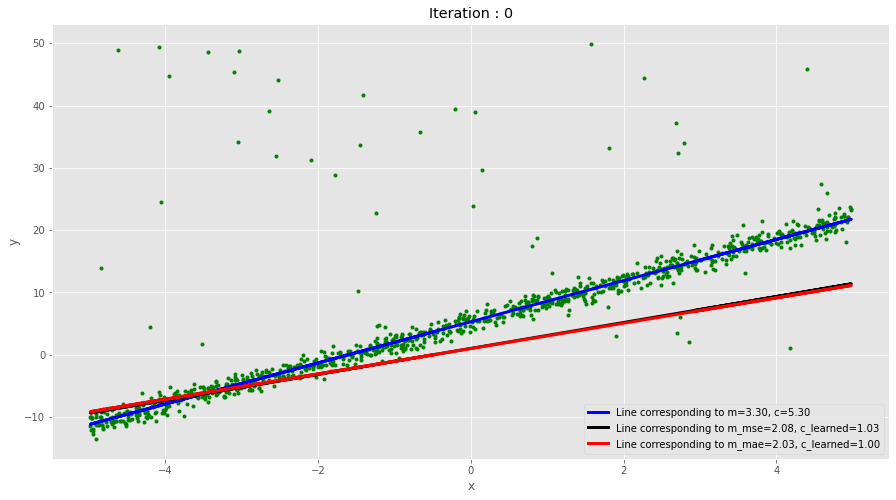

Iteration: 40, 
Loss_mse: 53.782, m_mse: 3.071, c_mse: 2.845
Loss_mae: 5.249, m_mae: 3.395,c_mae: 1.184


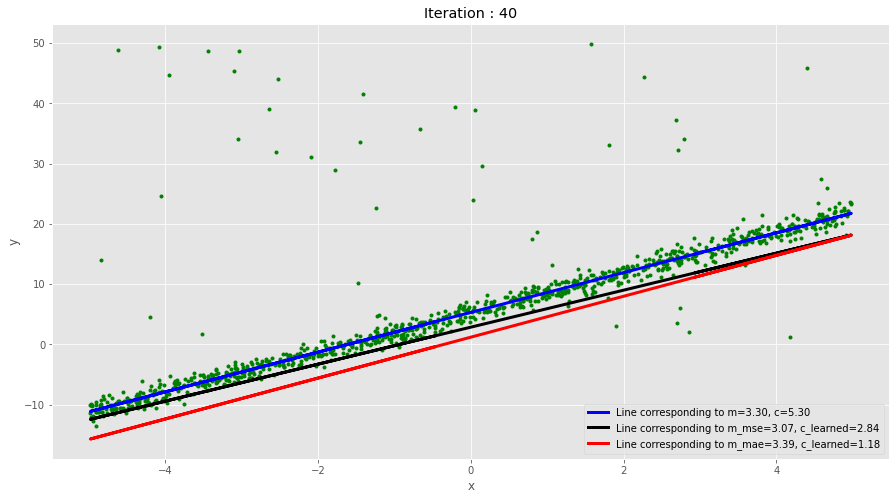

Iteration: 80, 
Loss_mse: 47.489, m_mse: 3.232, c_mse: 3.967
Loss_mae: 5.487, m_mae: 4.397,c_mae: 1.369


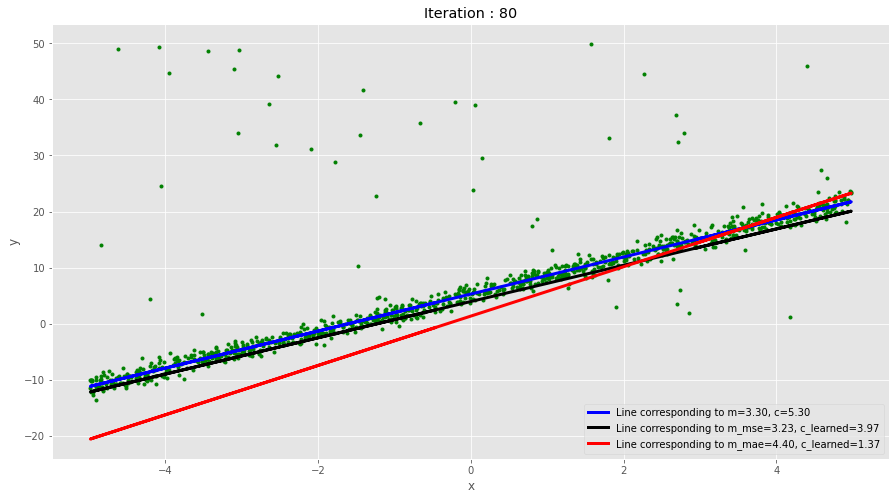

Iteration: 100, 
Loss_mse: 45.755, m_mse: 3.201, c_mse: 4.349
Loss_mae: 5.573, m_mae: 4.506,c_mae: 1.445


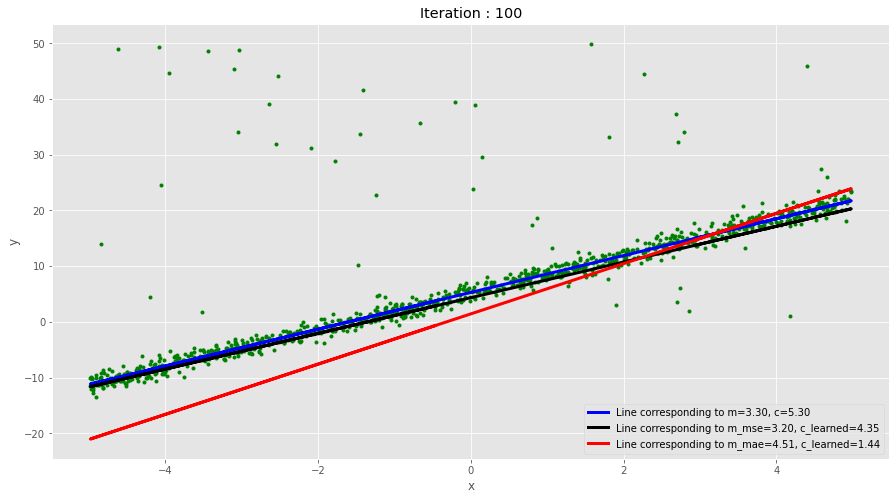

Iteration: 140, 
Loss_mse: 43.515, m_mse: 3.248, c_mse: 5.076
Loss_mae: 5.775, m_mae: 4.691,c_mae: 1.579


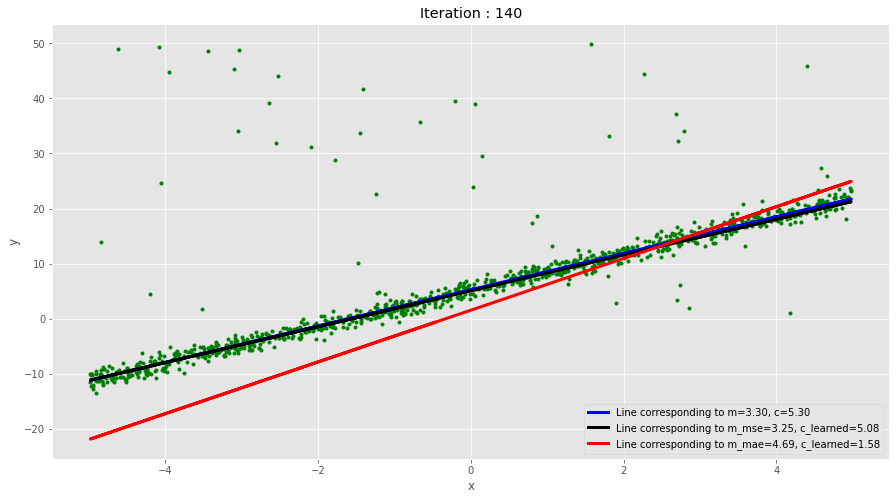

Iteration: 180, 
Loss_mse: 42.792, m_mse: 3.253, c_mse: 5.413
Loss_mae: 5.344, m_mae: 4.466,c_mae: 1.704


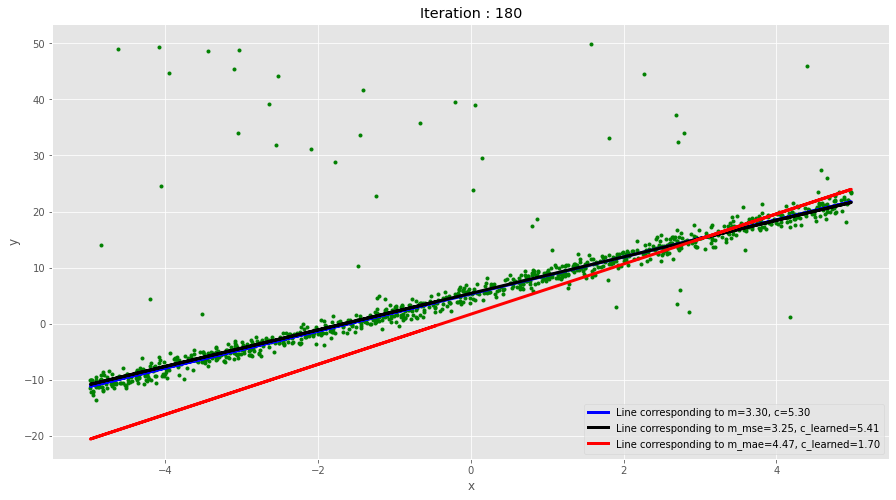

Iteration: 200, 
Loss_mse: 42.397, m_mse: 3.176, c_mse: 5.555
Loss_mae: 5.168, m_mae: 4.368,c_mae: 1.764


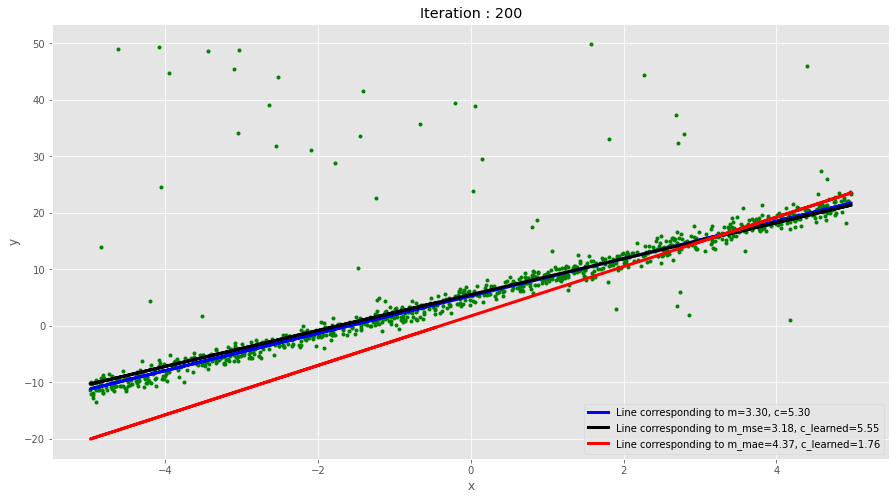

Iteration: 240, 
Loss_mse: 42.145, m_mse: 3.158, c_mse: 5.723
Loss_mae: 5.082, m_mae: 4.372,c_mae: 1.897


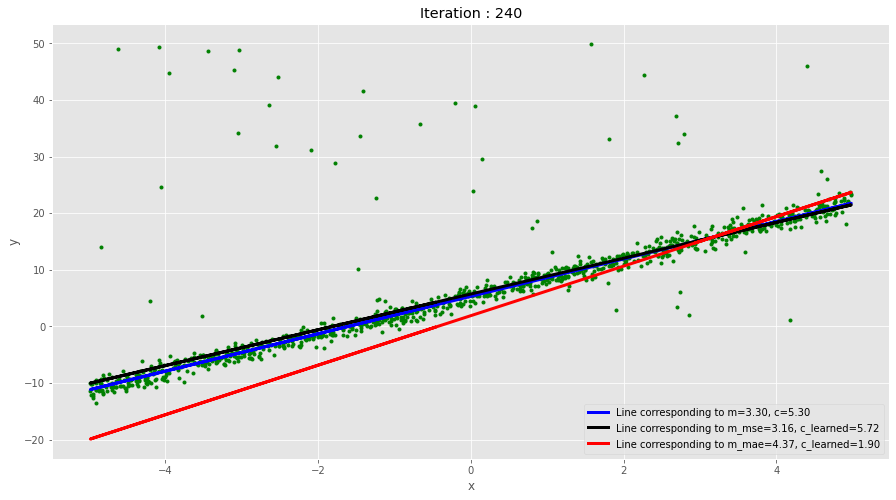

Iteration: 280, 
Loss_mse: 42.056, m_mse: 3.210, c_mse: 5.879
Loss_mae: 4.979, m_mae: 4.359,c_mae: 2.026


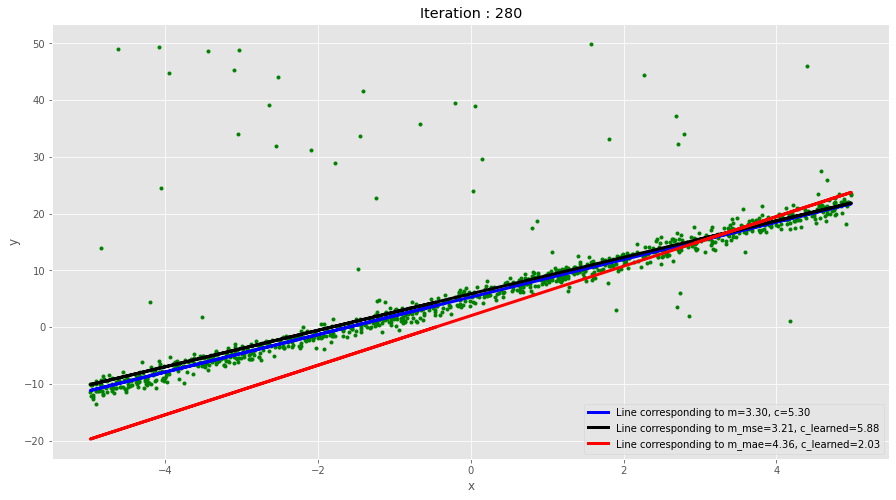

Iteration: 300, 
Loss_mse: 41.863, m_mse: 3.112, c_mse: 6.001
Loss_mae: 4.843, m_mae: 4.293,c_mae: 2.093


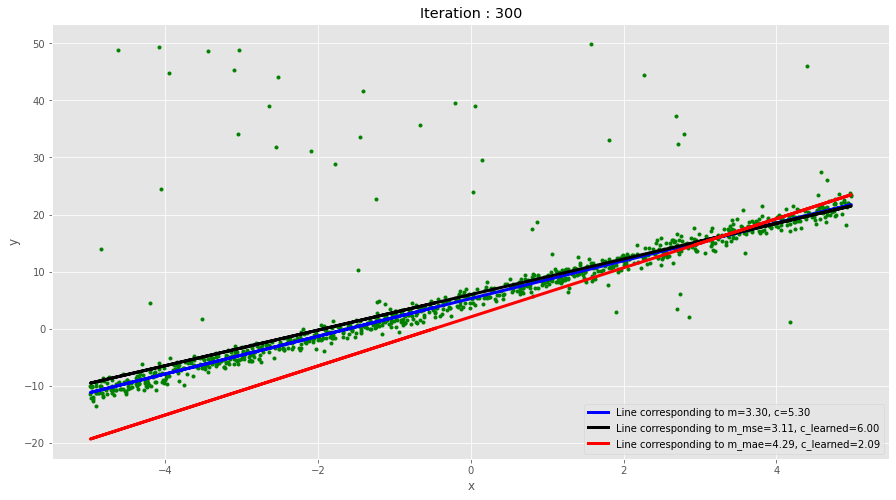

Iteration: 340, 
Loss_mse: 42.232, m_mse: 3.317, c_mse: 6.034
Loss_mae: 4.781, m_mae: 4.310,c_mae: 2.220


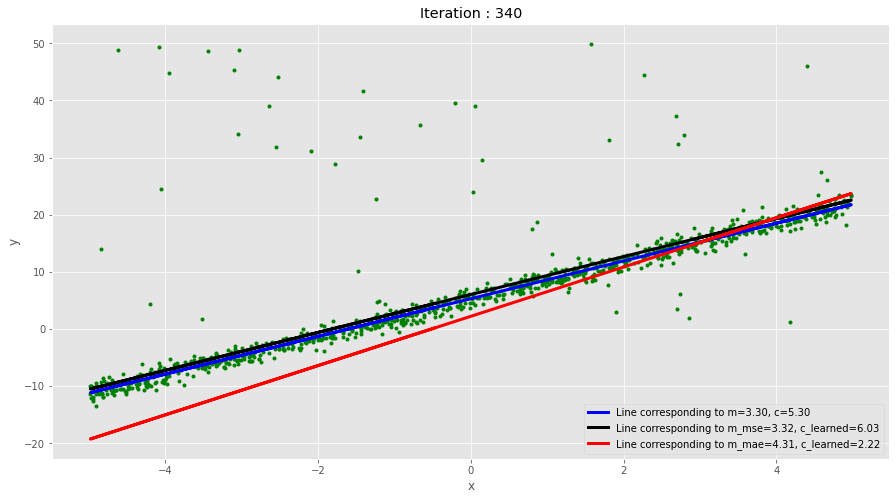

Iteration: 380, 
Loss_mse: 41.870, m_mse: 3.164, c_mse: 6.041
Loss_mae: 4.720, m_mae: 4.324,c_mae: 2.351


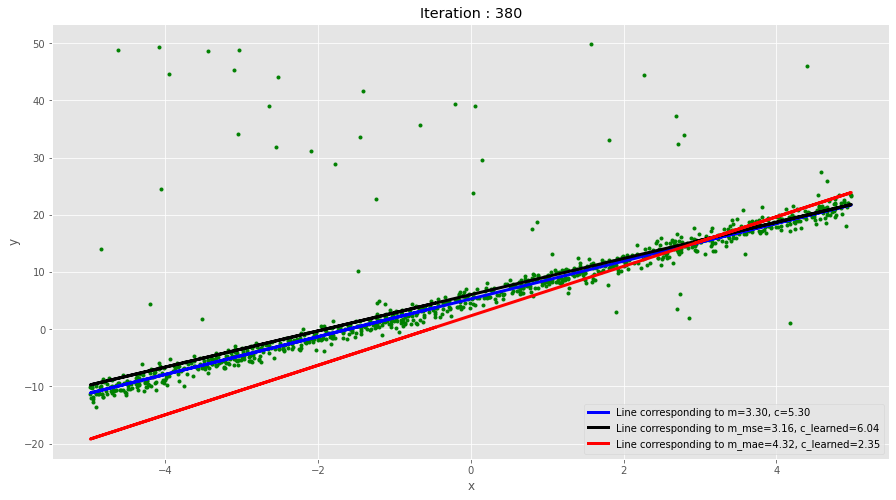

Iteration: 400, 
Loss_mse: 42.001, m_mse: 3.231, c_mse: 6.003
Loss_mae: 4.583, m_mae: 4.261,c_mae: 2.418


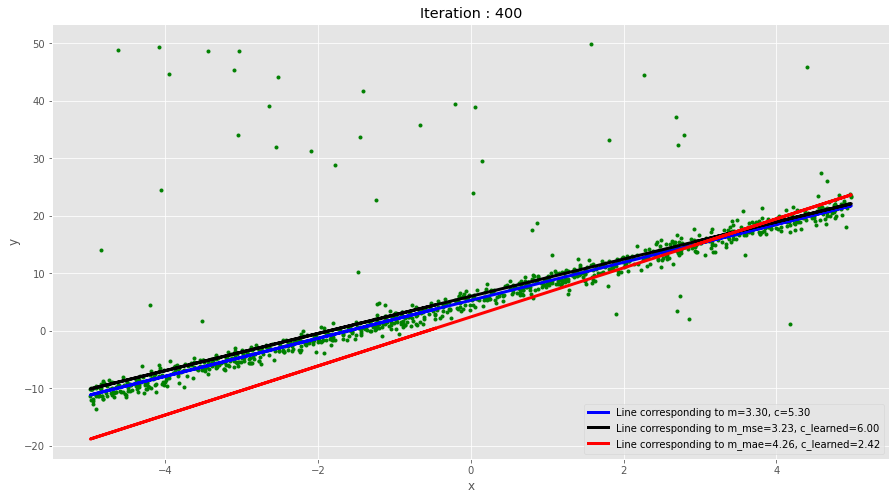

Iteration: 440, 
Loss_mse: 41.850, m_mse: 3.096, c_mse: 6.021
Loss_mae: 4.557, m_mae: 4.298,c_mae: 2.550


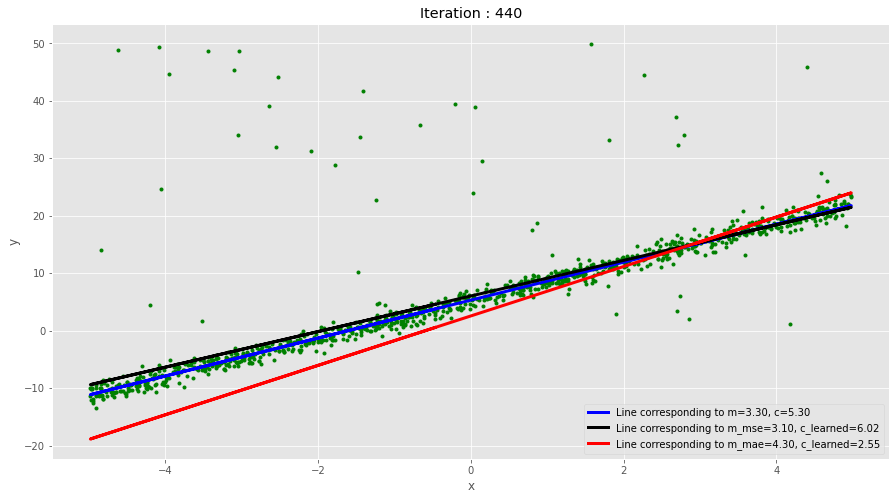

Iteration: 480, 
Loss_mse: 41.899, m_mse: 3.225, c_mse: 6.197
Loss_mae: 4.439, m_mae: 4.271,c_mae: 2.675


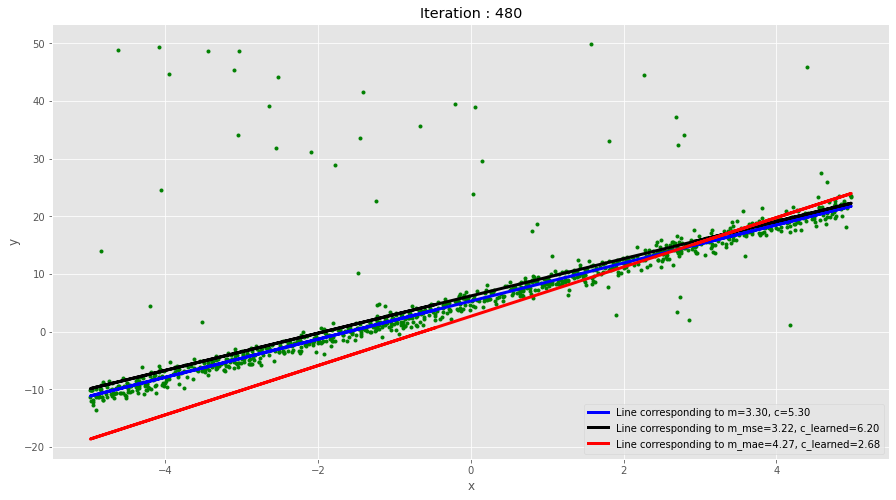

Iteration: 500, 
Loss_mse: 42.115, m_mse: 3.307, c_mse: 6.214
Loss_mae: 4.207, m_mae: 4.141,c_mae: 2.734


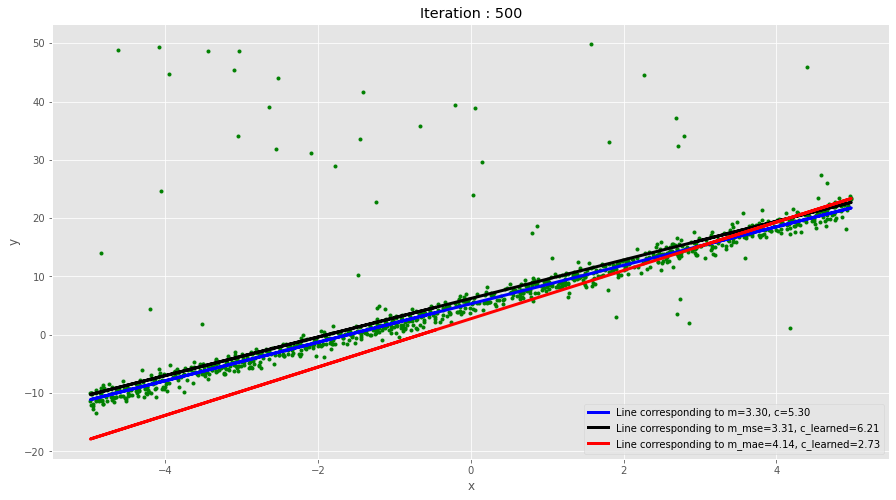

Iteration: 540, 
Loss_mse: 41.876, m_mse: 3.215, c_mse: 6.214
Loss_mae: 4.155, m_mae: 4.160,c_mae: 2.858


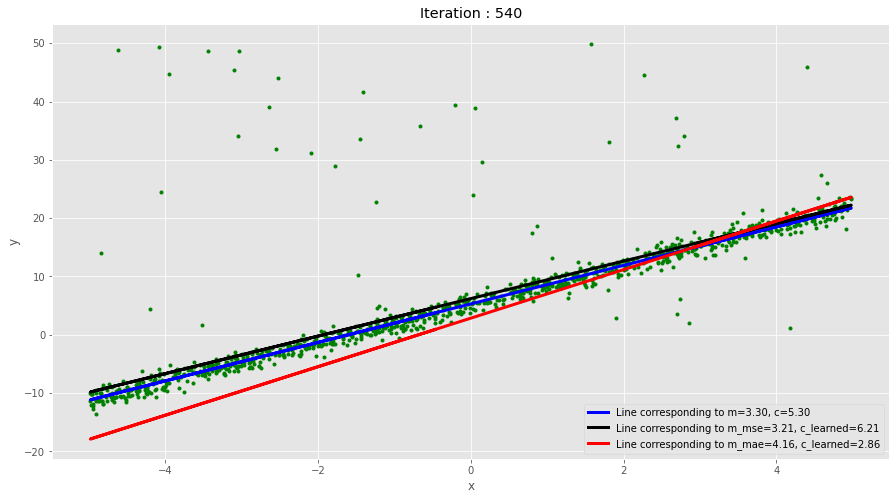

Iteration: 580, 
Loss_mse: 41.788, m_mse: 3.132, c_mse: 6.181
Loss_mae: 3.890, m_mae: 4.033,c_mae: 2.987


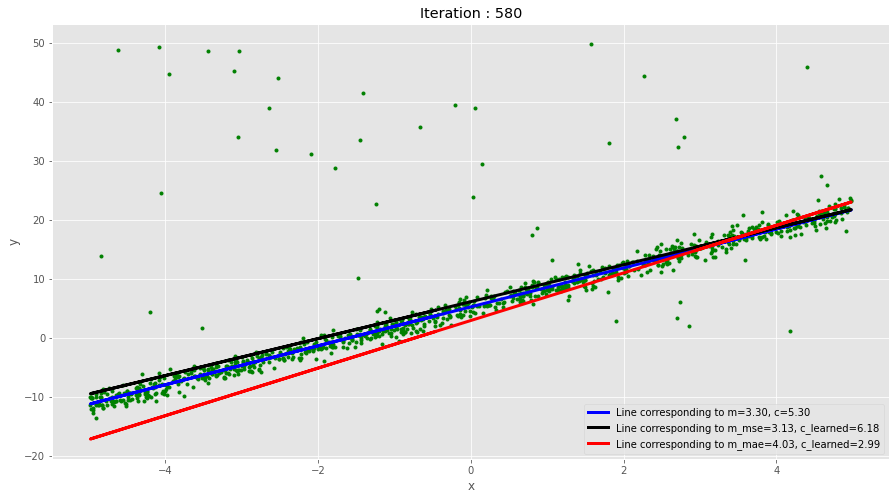

Iteration: 600, 
Loss_mse: 41.863, m_mse: 3.214, c_mse: 6.278
Loss_mae: 3.921, m_mae: 4.085,c_mae: 3.055


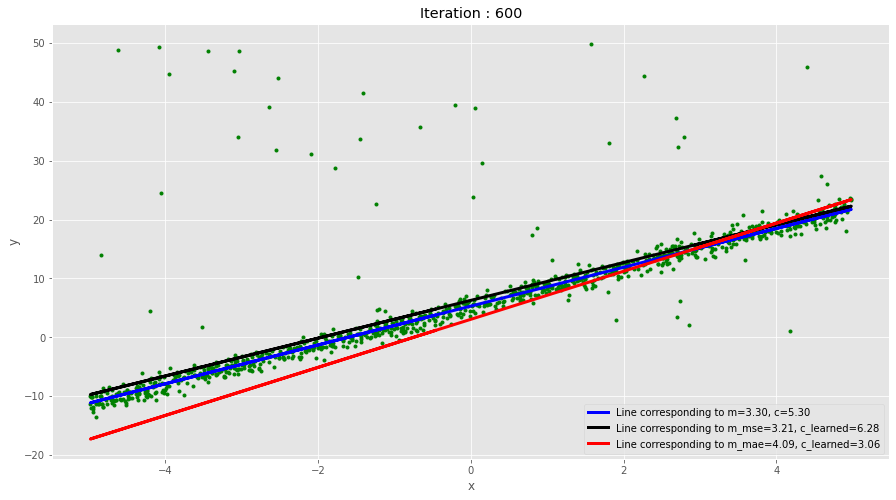

Iteration: 640, 
Loss_mse: 42.566, m_mse: 2.799, c_mse: 6.368
Loss_mae: 3.792, m_mae: 4.053,c_mae: 3.183


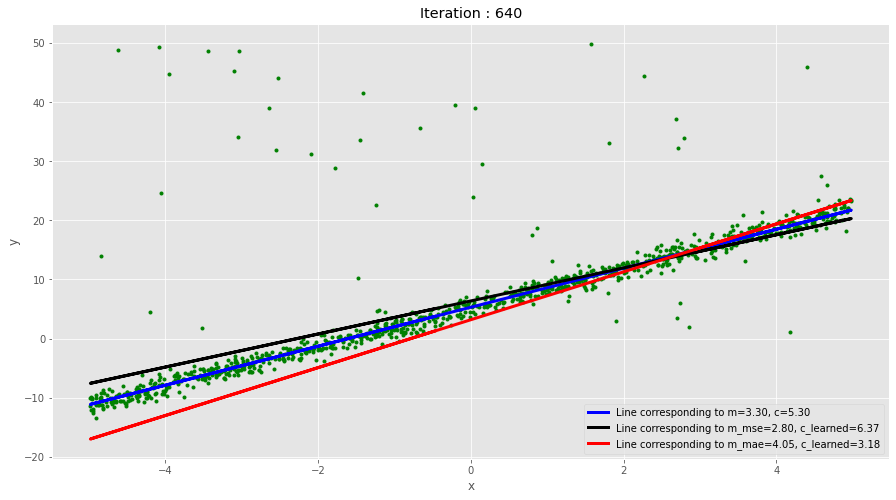

Iteration: 680, 
Loss_mse: 41.821, m_mse: 3.028, c_mse: 6.382
Loss_mae: 3.780, m_mae: 4.098,c_mae: 3.321


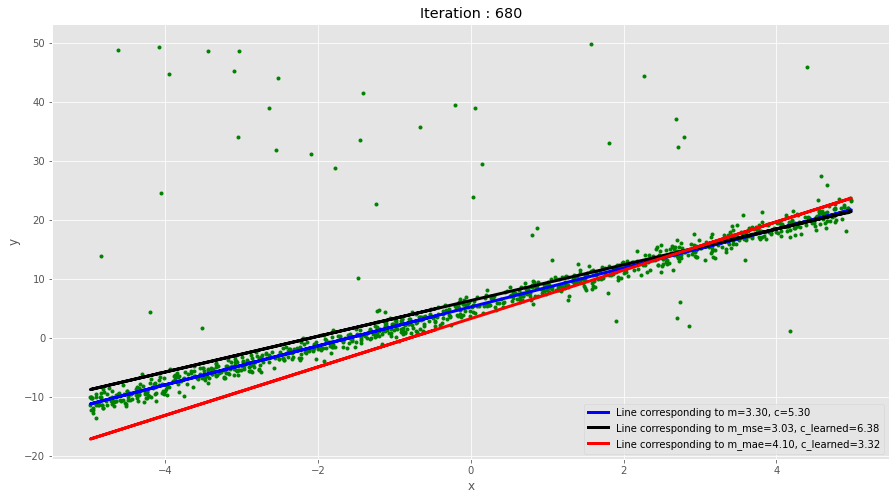

Iteration: 700, 
Loss_mse: 41.817, m_mse: 3.181, c_mse: 6.410
Loss_mae: 3.741, m_mae: 4.094,c_mae: 3.380


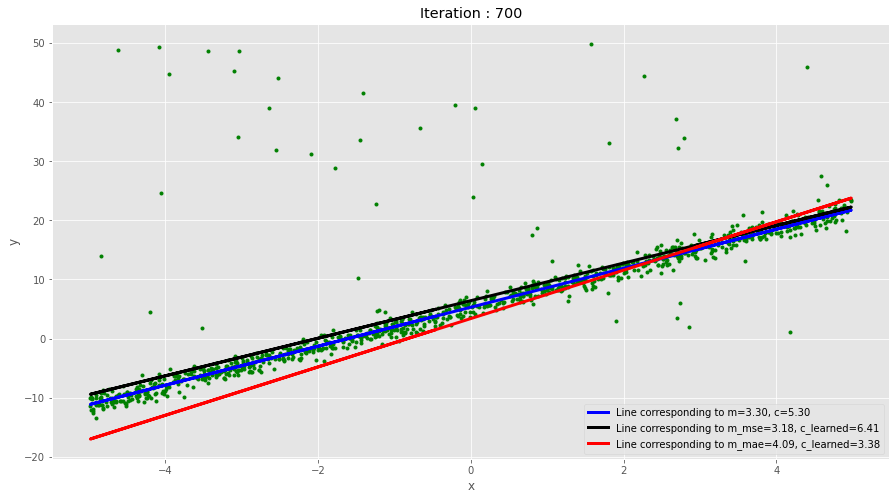

Iteration: 740, 
Loss_mse: 41.788, m_mse: 3.097, c_mse: 6.467
Loss_mae: 3.560, m_mae: 4.026,c_mae: 3.504


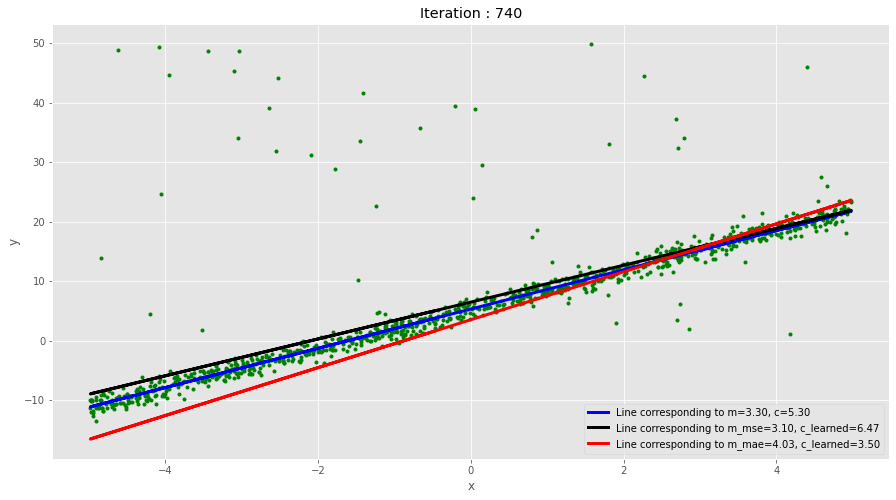

Iteration: 780, 
Loss_mse: 42.282, m_mse: 2.885, c_mse: 6.610
Loss_mae: 3.400, m_mae: 3.967,c_mae: 3.618


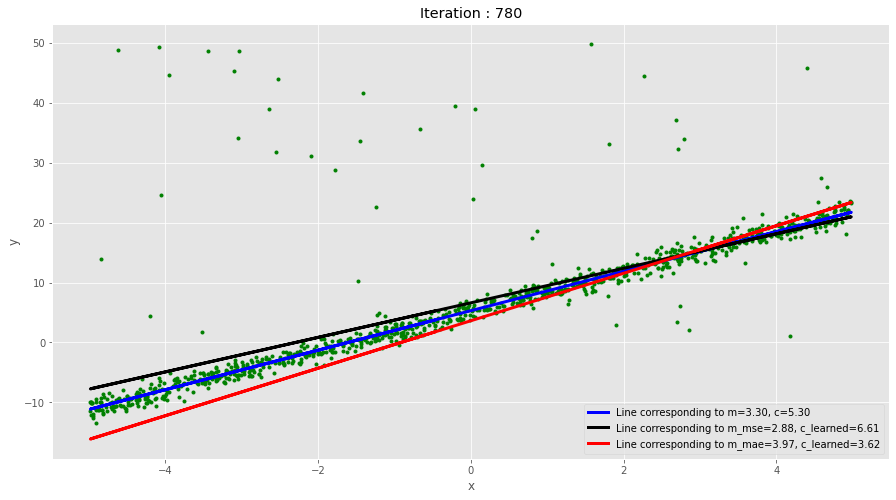

Iteration: 800, 
Loss_mse: 41.920, m_mse: 3.014, c_mse: 6.593
Loss_mae: 3.350, m_mae: 3.954,c_mae: 3.671


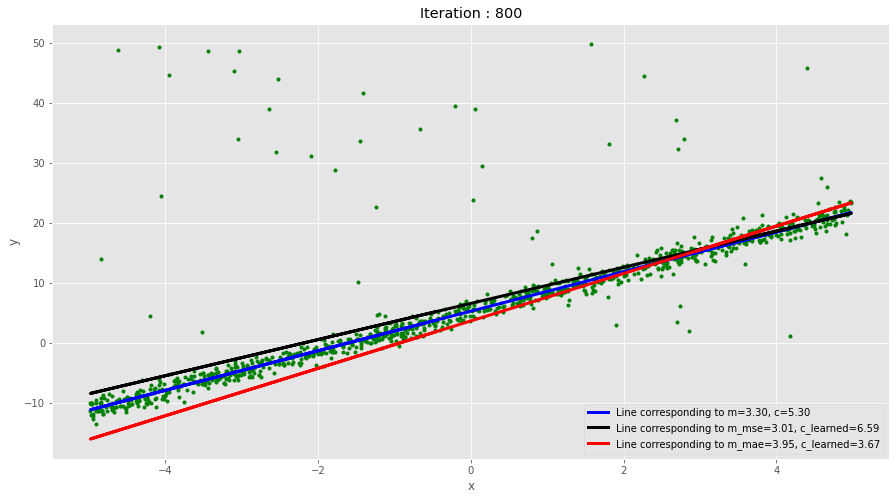

Iteration: 840, 
Loss_mse: 41.834, m_mse: 3.181, c_mse: 6.481
Loss_mae: 3.175, m_mae: 3.884,c_mae: 3.789


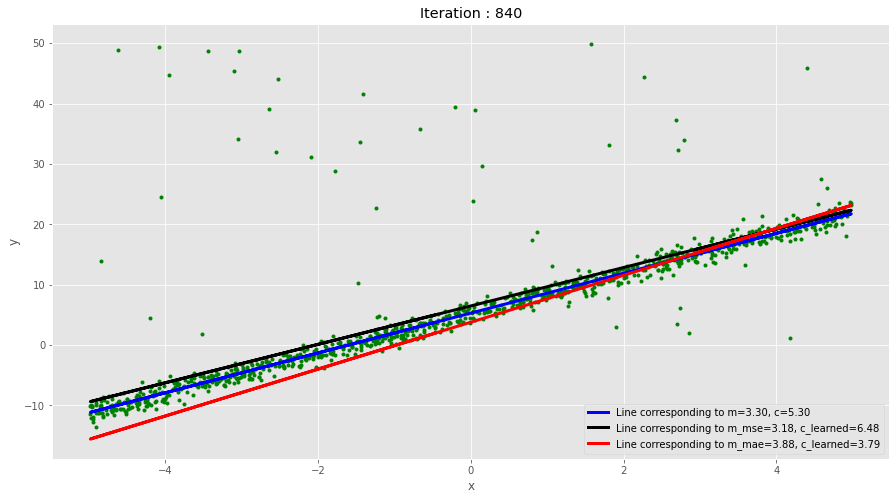

Iteration: 880, 
Loss_mse: 41.841, m_mse: 3.195, c_mse: 6.435
Loss_mae: 2.958, m_mae: 3.778,c_mae: 3.896


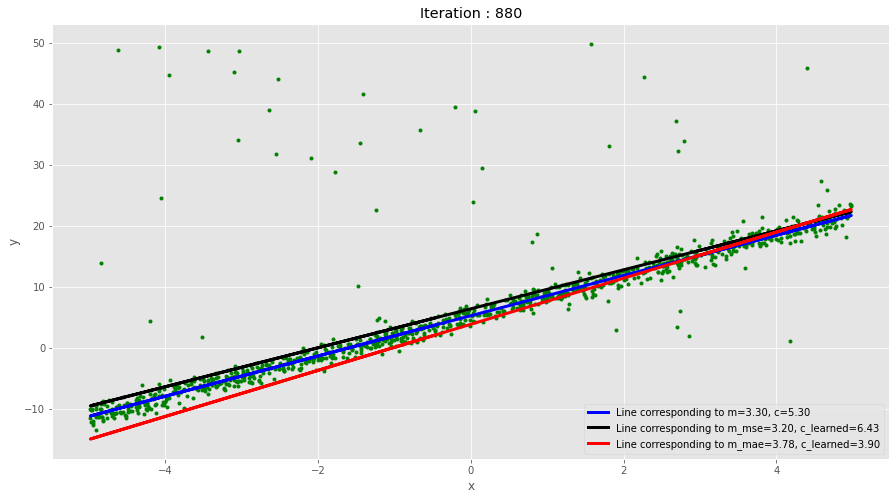

Iteration: 900, 
Loss_mse: 43.321, m_mse: 2.684, c_mse: 6.511
Loss_mae: 2.964, m_mae: 3.805,c_mae: 3.954


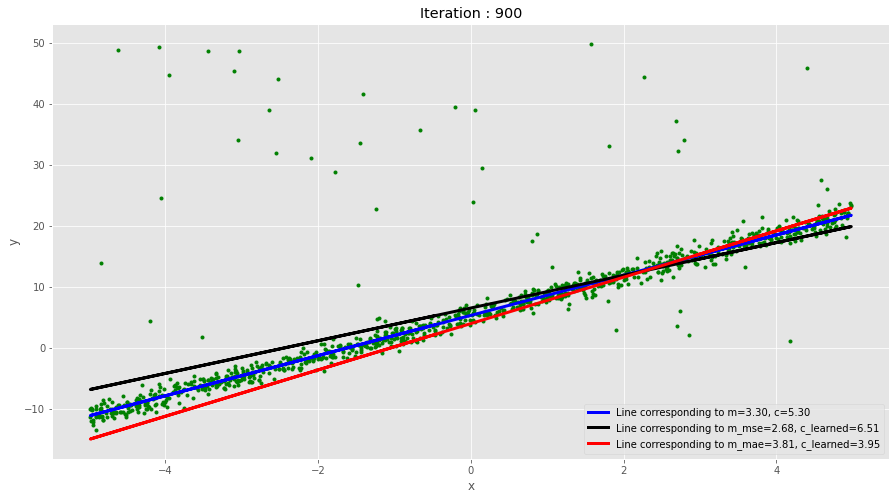

Iteration: 940, 
Loss_mse: 43.248, m_mse: 2.707, c_mse: 6.644
Loss_mae: 2.924, m_mae: 3.819,c_mae: 4.068


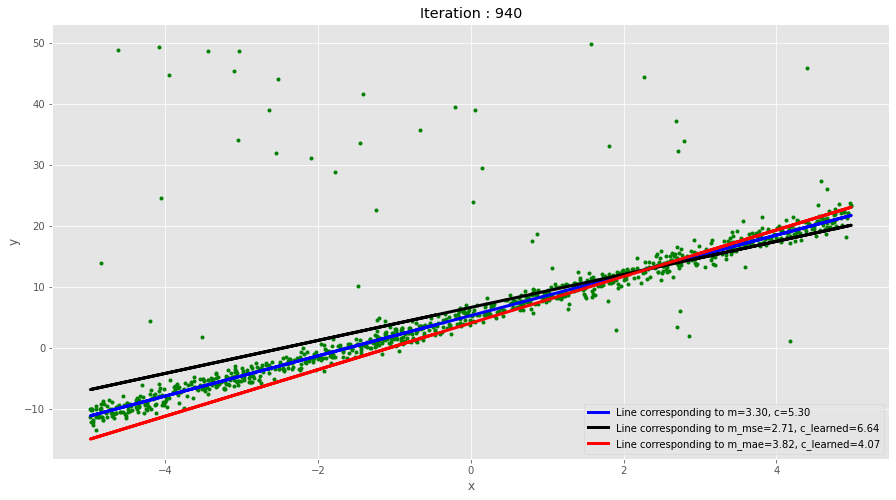

Iteration: 980, 
Loss_mse: 41.796, m_mse: 3.076, c_mse: 6.469
Loss_mae: 2.677, m_mae: 3.689,c_mae: 4.175


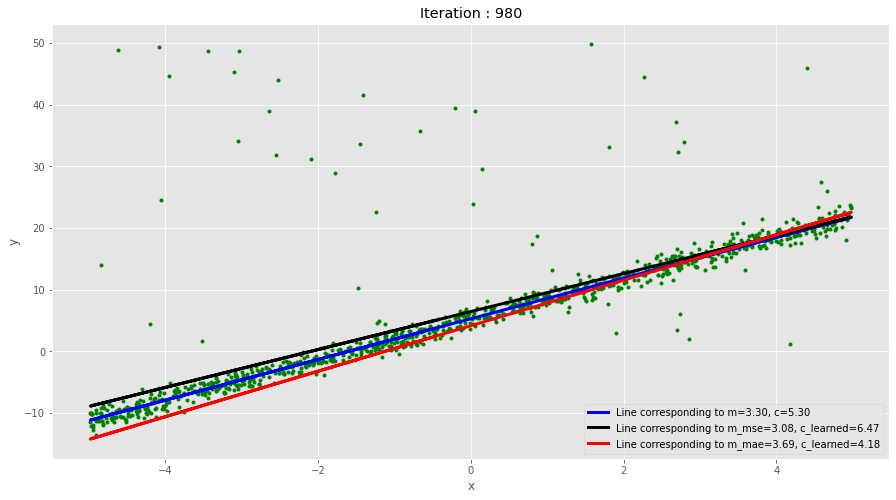

Iteration: 1000, 
Loss_mse: 41.813, m_mse: 3.179, c_mse: 6.401
Loss_mae: 2.705, m_mae: 3.731,c_mae: 4.234


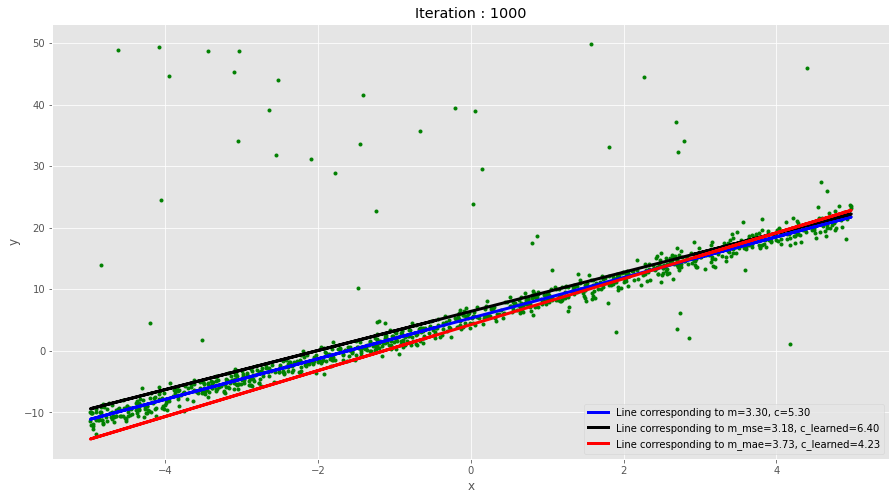

Iteration: 1040, 
Loss_mse: 41.834, m_mse: 3.197, c_mse: 6.363
Loss_mae: 2.501, m_mae: 3.624,c_mae: 4.340


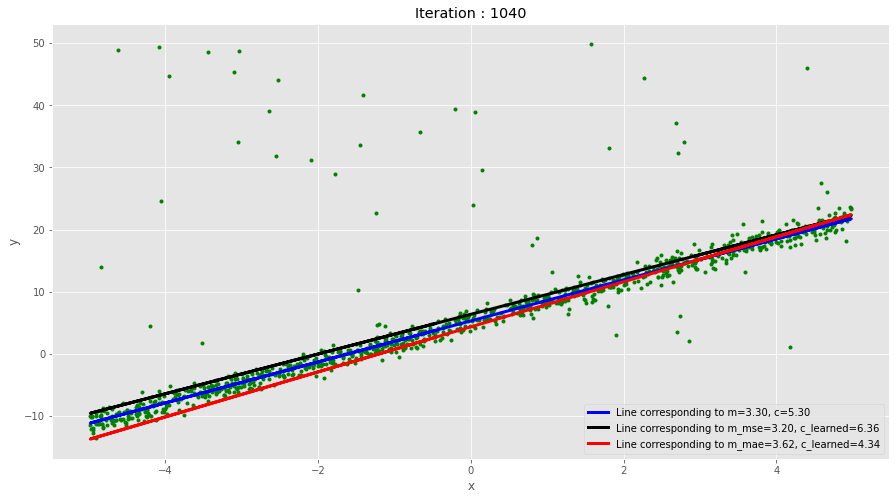

Iteration: 1080, 
Loss_mse: 41.900, m_mse: 3.229, c_mse: 6.437
Loss_mae: 2.532, m_mae: 3.684,c_mae: 4.442


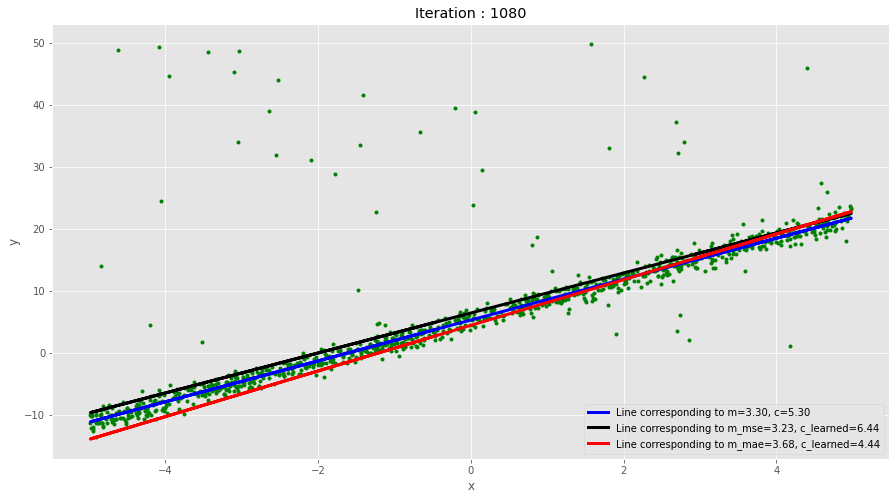

Iteration: 1100, 
Loss_mse: 41.819, m_mse: 3.065, c_mse: 6.511
Loss_mae: 2.435, m_mae: 3.632,c_mae: 4.486


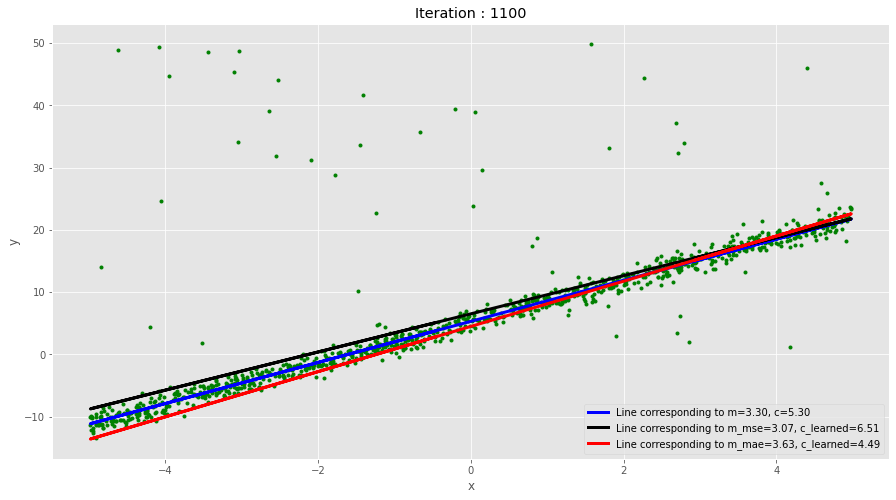

Iteration: 1140, 
Loss_mse: 42.114, m_mse: 3.311, c_mse: 6.318
Loss_mae: 2.256, m_mae: 3.523,c_mae: 4.580


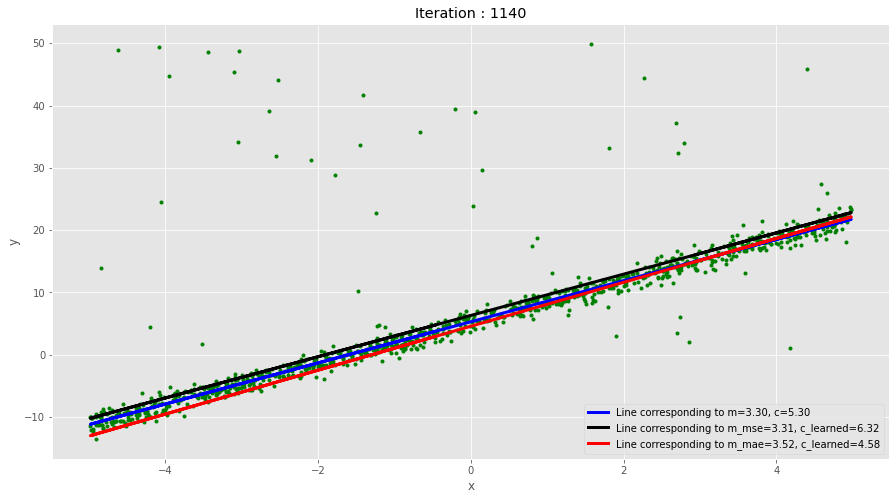

Iteration: 1180, 
Loss_mse: 41.895, m_mse: 2.982, c_mse: 6.330
Loss_mae: 2.302, m_mae: 3.596,c_mae: 4.671


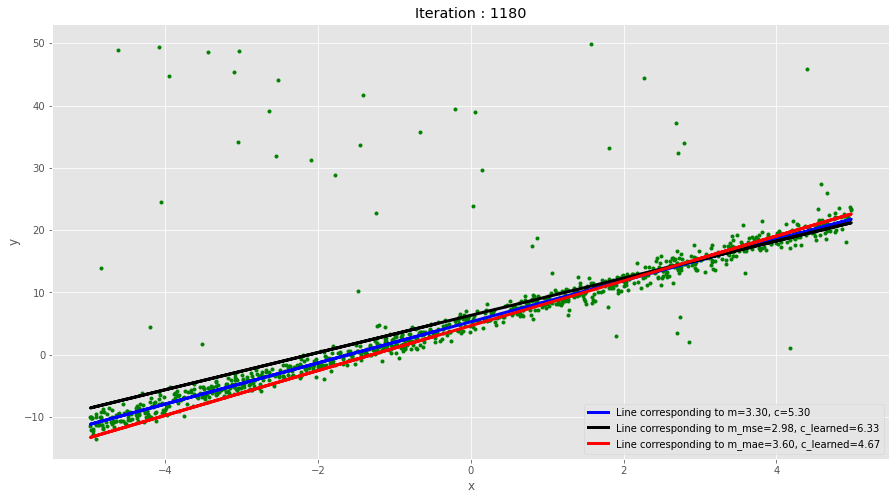

Iteration: 1200, 
Loss_mse: 41.950, m_mse: 2.958, c_mse: 6.332
Loss_mae: 2.208, m_mae: 3.537,c_mae: 4.717


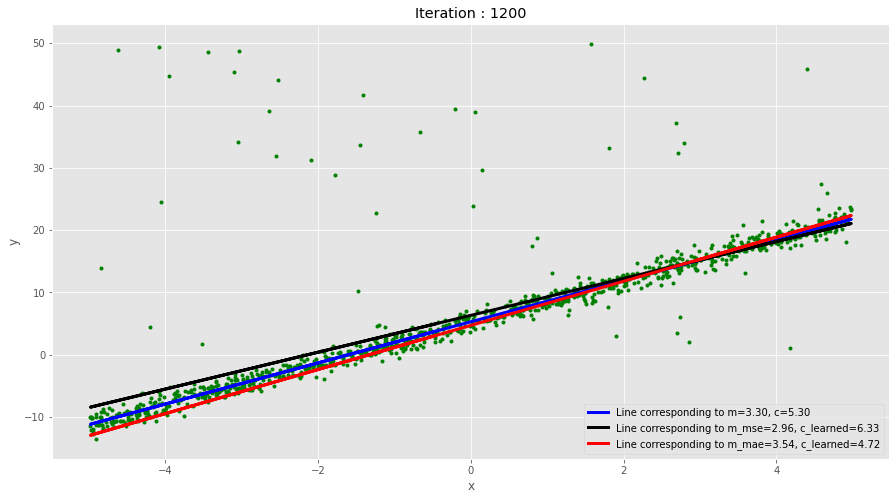

Iteration: 1240, 
Loss_mse: 41.925, m_mse: 3.244, c_mse: 6.285
Loss_mae: 2.088, m_mae: 3.442,c_mae: 4.789


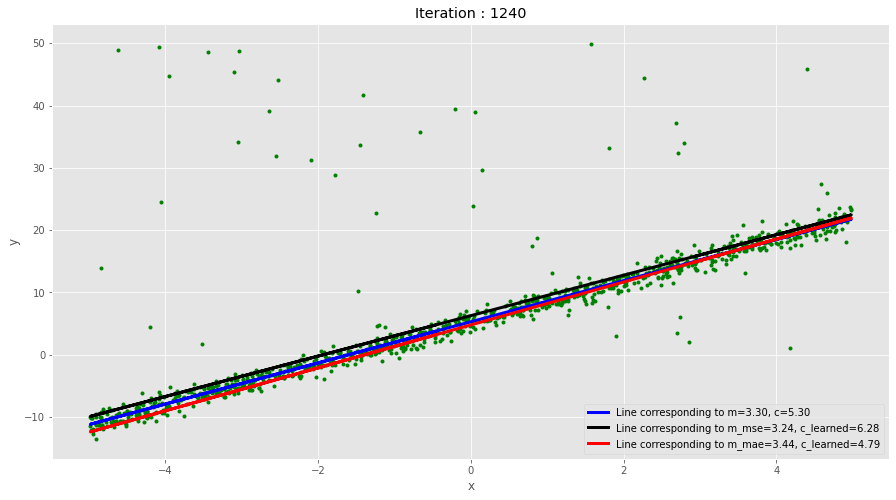

Iteration: 1280, 
Loss_mse: 42.317, m_mse: 3.361, c_mse: 6.249
Loss_mae: 2.085, m_mae: 3.469,c_mae: 4.857


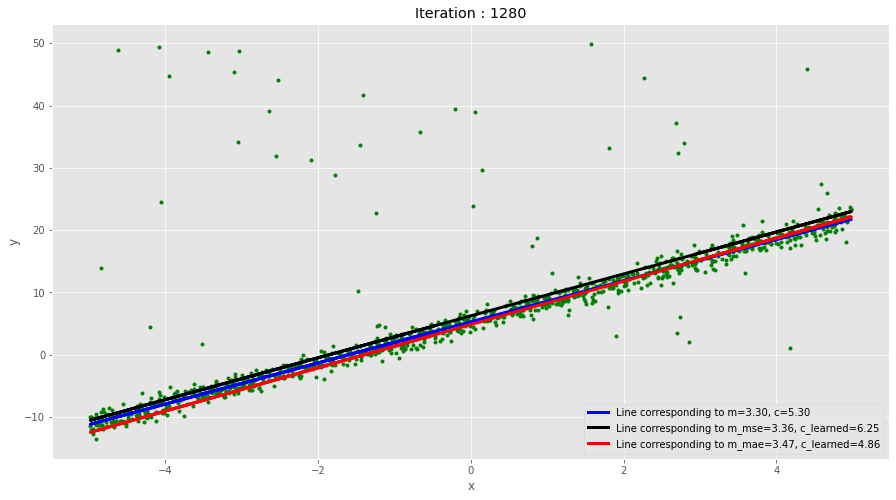

Iteration: 1300, 
Loss_mse: 42.191, m_mse: 3.332, c_mse: 6.316
Loss_mae: 2.139, m_mae: 3.534,c_mae: 4.899


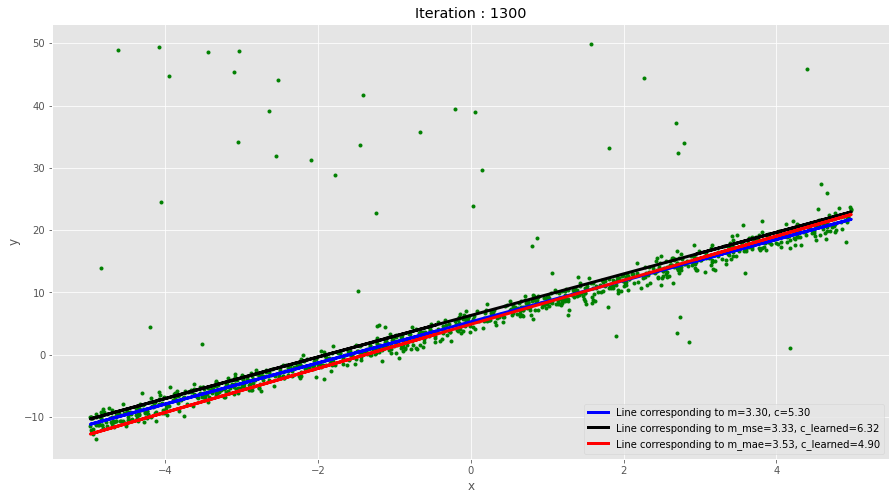

Iteration: 1340, 
Loss_mse: 42.108, m_mse: 2.905, c_mse: 6.364
Loss_mae: 2.088, m_mae: 3.506,c_mae: 4.962


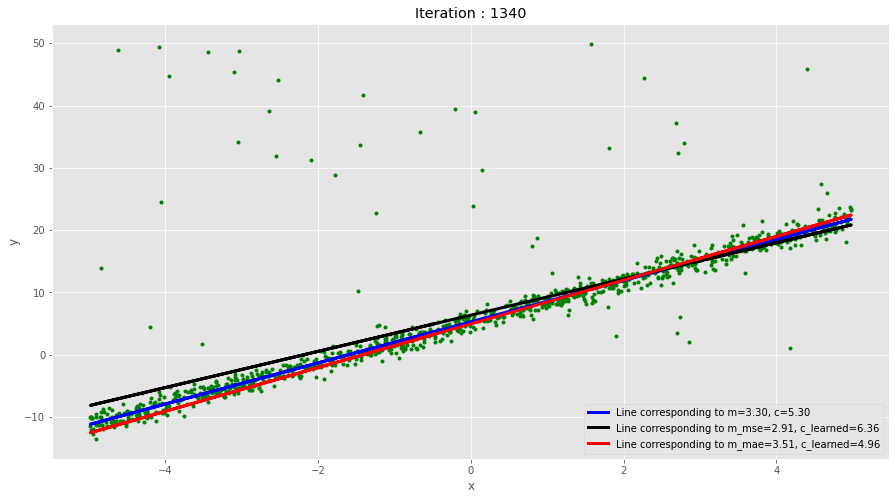

Iteration: 1380, 
Loss_mse: 41.868, m_mse: 3.204, c_mse: 6.171
Loss_mae: 2.088, m_mae: 3.516,c_mae: 5.007


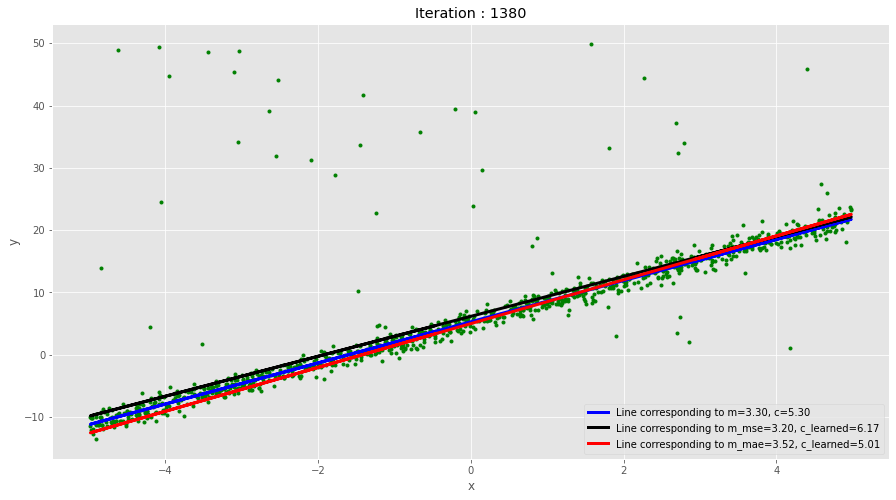

Iteration: 1400, 
Loss_mse: 42.179, m_mse: 2.884, c_mse: 6.297
Loss_mae: 2.073, m_mae: 3.511,c_mae: 5.041


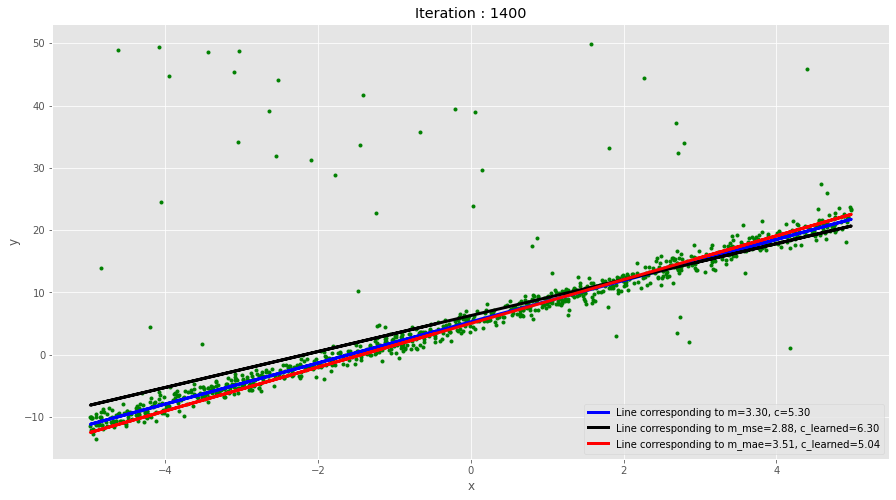

Iteration: 1440, 
Loss_mse: 41.792, m_mse: 3.050, c_mse: 6.273
Loss_mae: 2.052, m_mae: 3.501,c_mae: 5.085


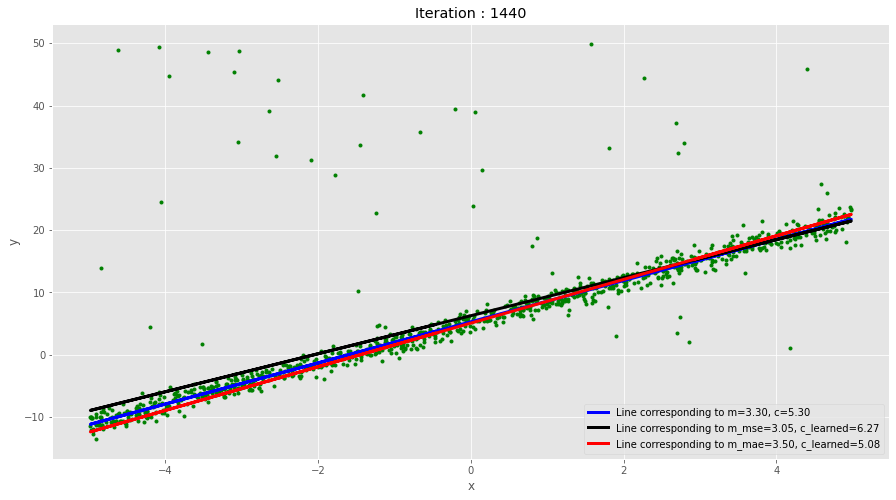

Iteration: 1480, 
Loss_mse: 41.814, m_mse: 3.031, c_mse: 6.259
Loss_mae: 1.994, m_mae: 3.447,c_mae: 5.117


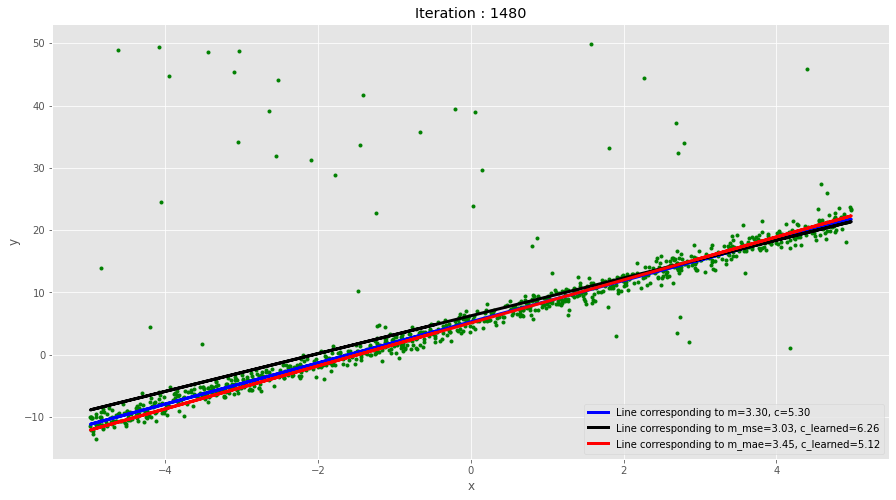

Iteration: 1500, 
Loss_mse: 41.774, m_mse: 3.098, c_mse: 6.216
Loss_mae: 1.983, m_mae: 3.438,c_mae: 5.144


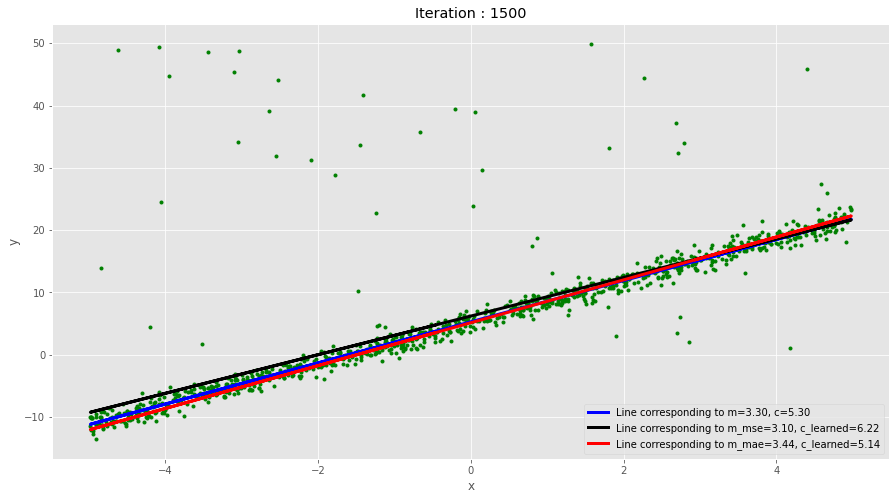

Iteration: 1540, 
Loss_mse: 41.835, m_mse: 3.196, c_mse: 6.387
Loss_mae: 2.070, m_mae: 3.528,c_mae: 5.169


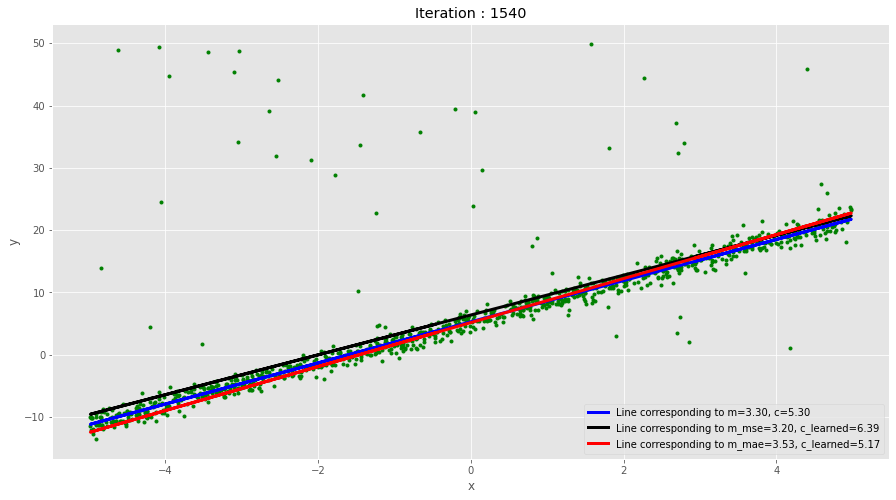

Iteration: 1580, 
Loss_mse: 41.945, m_mse: 3.254, c_mse: 6.312
Loss_mae: 1.984, m_mae: 3.448,c_mae: 5.195


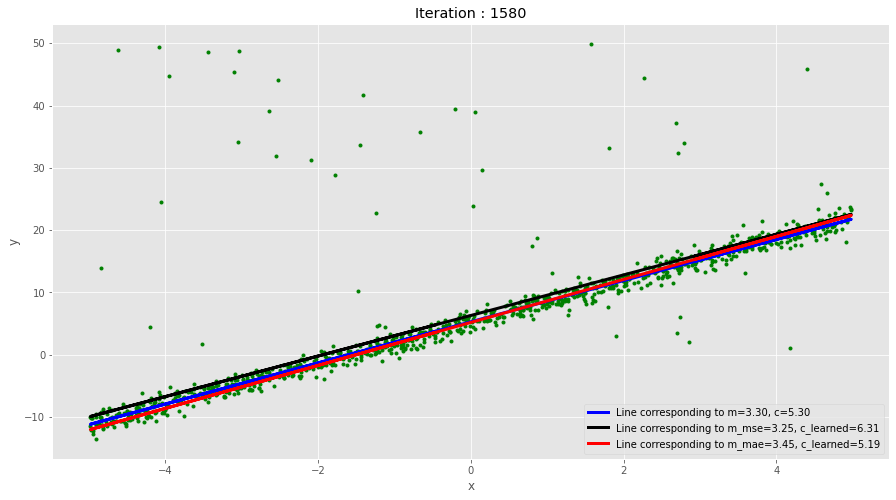

Iteration: 1600, 
Loss_mse: 41.788, m_mse: 3.146, c_mse: 6.213
Loss_mae: 1.938, m_mae: 3.363,c_mae: 5.203


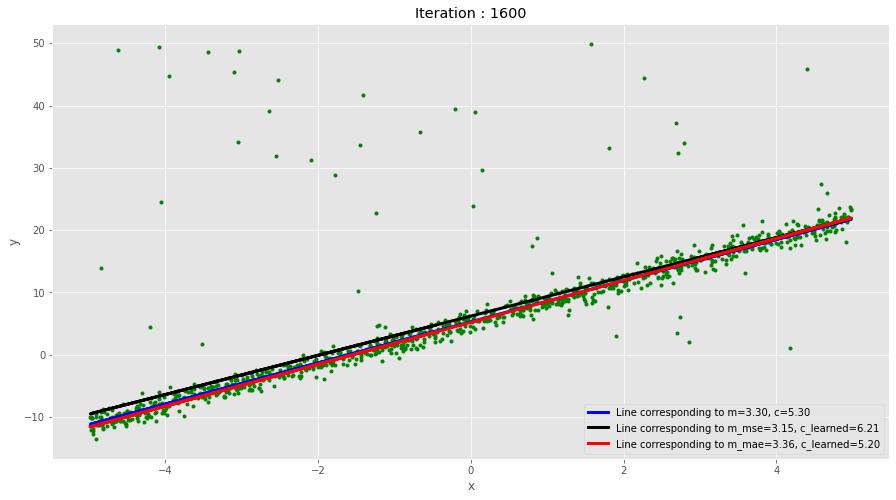

Iteration: 1640, 
Loss_mse: 42.020, m_mse: 3.266, c_mse: 6.129
Loss_mae: 1.937, m_mae: 3.358,c_mae: 5.204


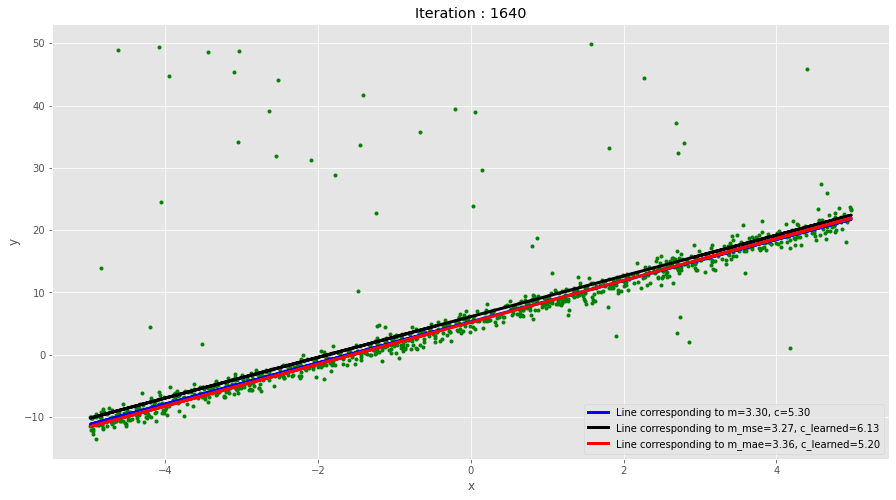

Iteration: 1680, 
Loss_mse: 41.793, m_mse: 3.165, c_mse: 6.303
Loss_mae: 2.014, m_mae: 3.486,c_mae: 5.230


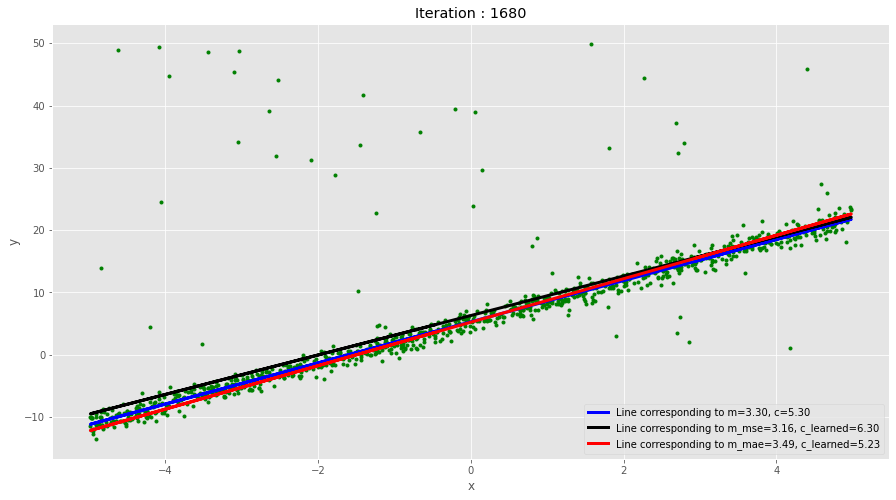

Iteration: 1700, 
Loss_mse: 42.111, m_mse: 3.310, c_mse: 6.320
Loss_mae: 1.977, m_mae: 3.444,c_mae: 5.230


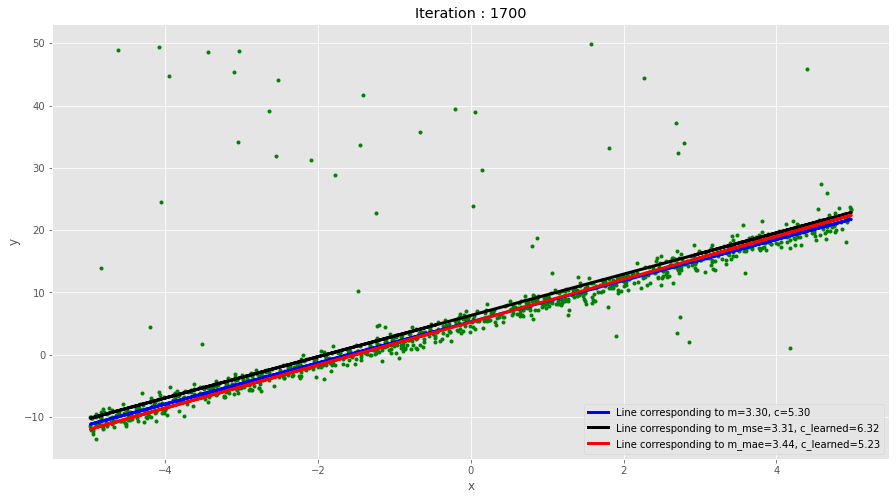

Iteration: 1740, 
Loss_mse: 41.887, m_mse: 3.222, c_mse: 6.227
Loss_mae: 1.935, m_mae: 3.358,c_mae: 5.233


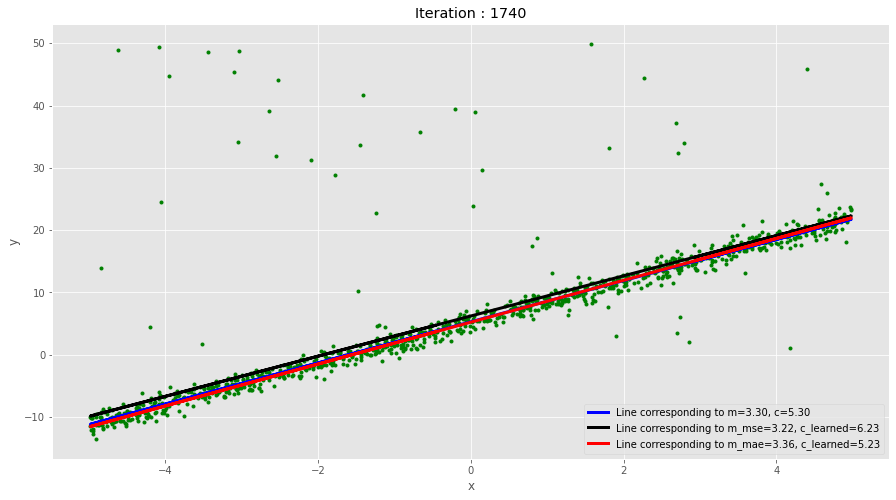

Iteration: 1780, 
Loss_mse: 41.957, m_mse: 2.959, c_mse: 6.185
Loss_mae: 1.944, m_mae: 3.391,c_mae: 5.245


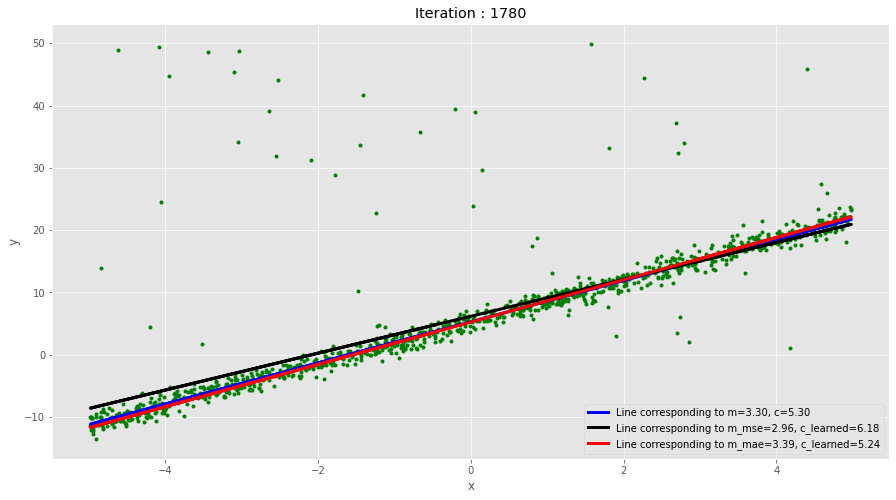

Iteration: 1800, 
Loss_mse: 41.953, m_mse: 3.226, c_mse: 6.068
Loss_mae: 1.929, m_mae: 3.326,c_mae: 5.255


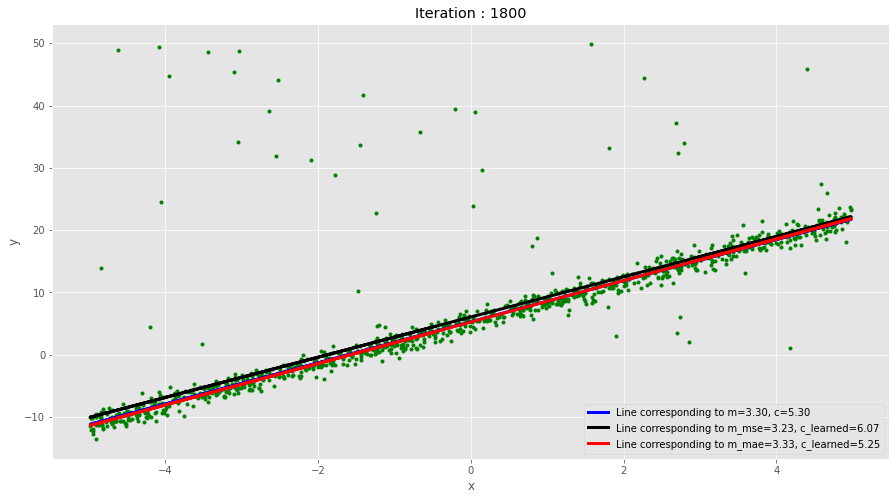

Iteration: 1840, 
Loss_mse: 41.954, m_mse: 2.957, c_mse: 6.233
Loss_mae: 1.988, m_mae: 3.461,c_mae: 5.273


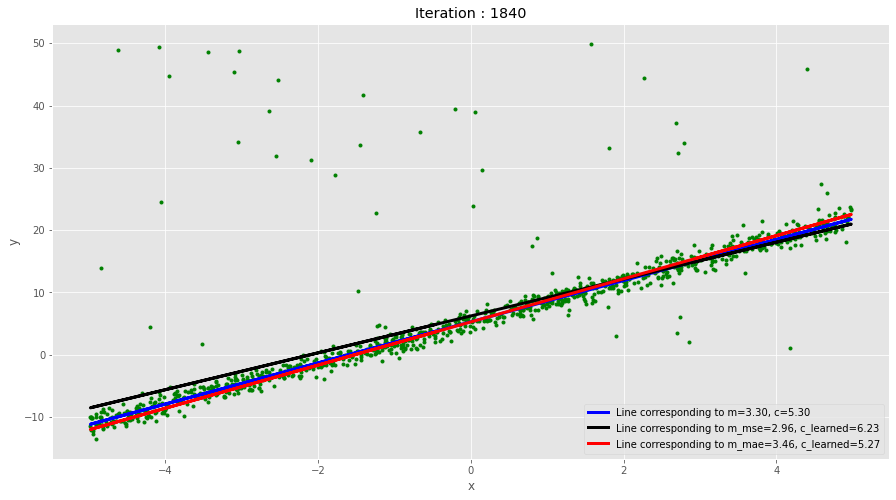

Iteration: 1880, 
Loss_mse: 41.784, m_mse: 3.151, c_mse: 6.383
Loss_mae: 1.934, m_mae: 3.367,c_mae: 5.280


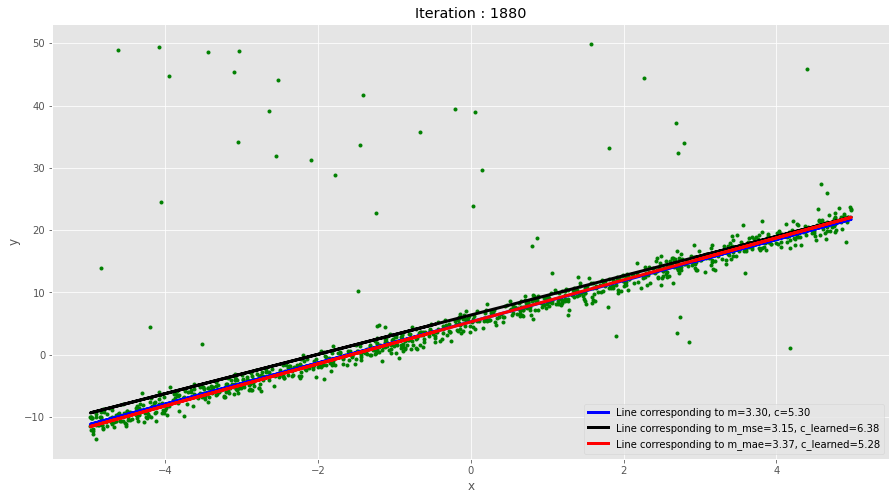

Iteration: 1900, 
Loss_mse: 42.112, m_mse: 2.910, c_mse: 6.448
Loss_mae: 1.953, m_mae: 3.413,c_mae: 5.287


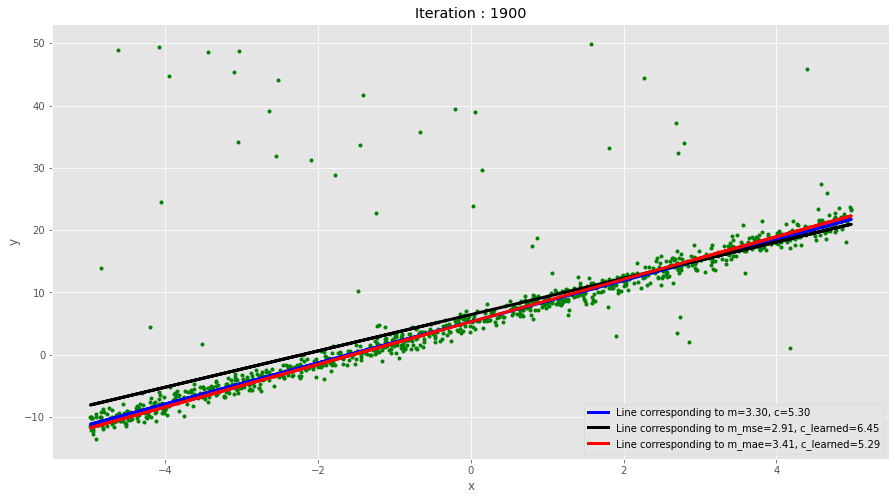

Iteration: 1940, 
Loss_mse: 41.815, m_mse: 3.035, c_mse: 6.400
Loss_mae: 1.940, m_mae: 3.386,c_mae: 5.305


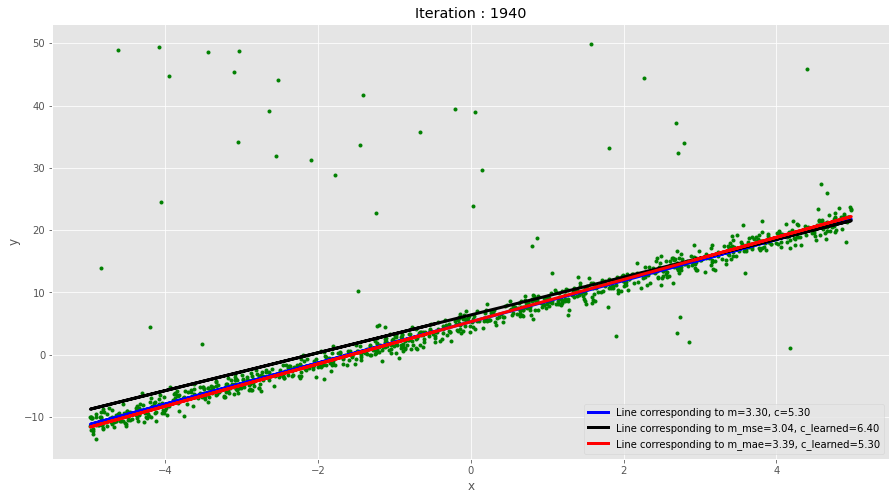

Iteration: 1980, 
Loss_mse: 41.927, m_mse: 3.246, c_mse: 6.330
Loss_mae: 1.936, m_mae: 3.375,c_mae: 5.300


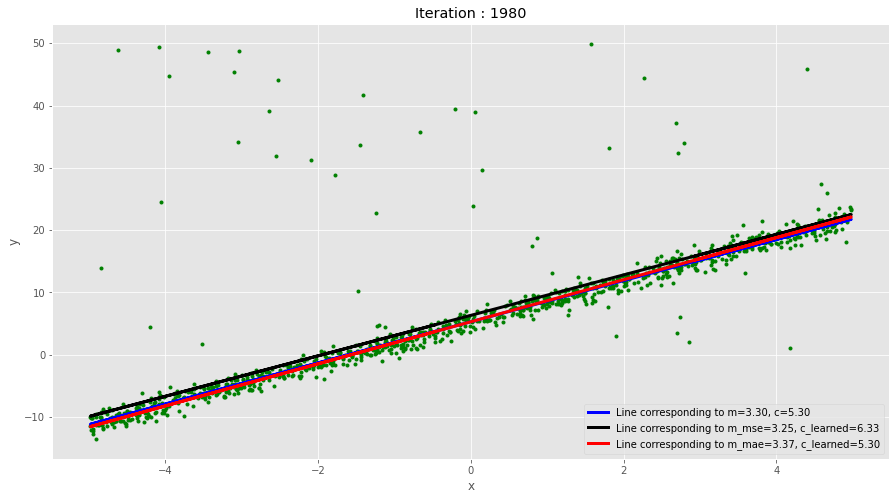

In [763]:
# inputs
inputs = x

# output/labels
labels = y_label

# labels around y
labels_origin = y

# epoch 
epoch=20

# learning rate
lr = 0.005

# batch size
batch_size=10

# dislpay plot count
display_count=40

# inital m
initial_m = 2

# initail c
initial_c = 1

grad_fun_m_c_list = [gradient_wrt_m_and_c_mse, gradient_wrt_m_and_c_mae]

loss_fun_list = [MSE_loss, MAE_loss]

m, c, loss, final_iteration = train(inputs, labels, labels_origin, initial_m, initial_c, grad_fun_m_c_list, 
                                    loss_fun_list, lr, batch_size, epoch, display_count)

--------------------------
Final plots
--------------------------
Iteration: 1999, 
Loss_mse: 41.940, m_mse: 3.236, c_mse: 6.143
Loss_mae: 1.929, m_mae: 3.347,c_mae: 5.295


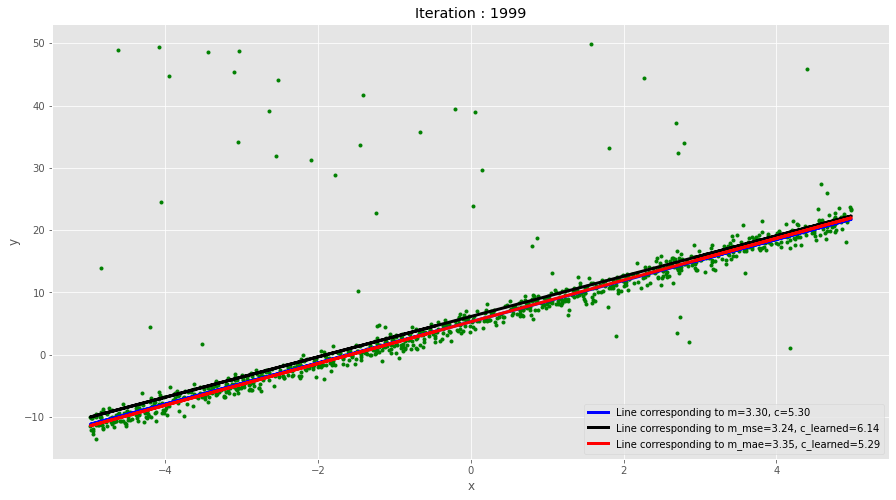

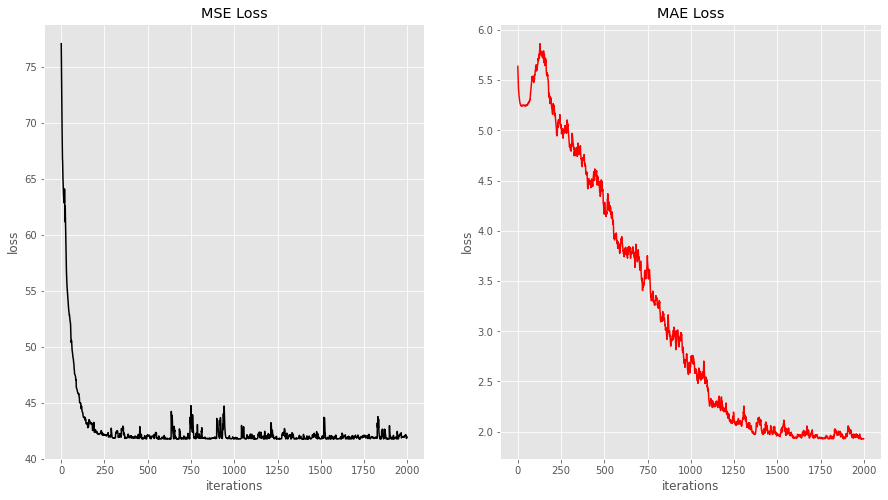

In [764]:
print('{0}\nFinal plots\n{0}'.format('--------------------------'))

display_training(inputs, labels_origin, labels, loss, m, c, iteration=final_iteration)

plot_loss(loss)


**In the above plot, we can observe that the line learned with mean square error deviated more compare to mean absolute error.**